## Experiment 12
- Summing masks for each frame

In [1]:
import os 
os.chdir('../../')

In [77]:
# -*- coding: utf-8 -*-
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import math
import time
import importlib
import os
import argparse
import copy
import datetime
import random
import sys
import json

import torch
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.utils.model_zoo as model_zoo
from torchvision import models
import torch.multiprocessing as mp
from torchvision import transforms

# My libs
from core.utils import Stack, ToTorchFormatTensor
import xarray as xr

from ssh_scripts.plot_maps import plot
from cartopy import crs as ccrs

In [78]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [79]:
%matplotlib inline
plt.rcParams ['figure.figsize']  = 25, 10
plt.rcParams ['axes.labelsize']  = 14
plt.rcParams ['xtick.labelsize'] = 12
plt.rcParams ['ytick.labelsize'] = 12
plt.rcParams ['text.color']      = 'black'
plt.rcParams ['axes.labelcolor'] = 'black'
plt.rcParams ['xtick.color']     = 'black'
plt.rcParams ['ytick.color']     = 'black'
# plt.style.use('fivethirtyeight')


In [80]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [221]:
experiment = 12
path = f'Experiments/Experiment{experiment}/'
video = path + 'examples/'
mask = path + 'ssh_examples/'
ckpt = 'checkpoints/fine_tuned1.pth'
# ckpt = 'checkpoints/sttn.pth'

model = 'sttn'

In [222]:
w, h = 192, 192
# w, h = 432, 240
ref_length = 10
neighbor_stride = 5
default_fps = 24

_to_tensors = transforms.Compose([
    Stack(),
    ToTorchFormatTensor()])

# sample reference frames from the whole video 
def get_ref_index(neighbor_ids, length):
    ref_index = []
    for i in range(0, length, ref_length):
        if not i in neighbor_ids:
            ref_index.append(i)
    return ref_index


# read frame-wise masks 
def read_mask(mpath):
    masks = []
    mnames = os.listdir(mpath)
    mnames.sort()
    for m in mnames: 
        if 'ipynb' not in m:
            m = Image.open(os.path.join(mpath, m))
            m = m.resize((w, h), Image.NEAREST)
            m = np.array(m.convert('L'))
            m = np.array(m > 0).astype(np.uint8)
#             m = cv2.dilate(m, cv2.getStructuringElement(
#                 cv2.MORPH_CROSS, (3, 3)), iterations=4)
            masks.append(Image.fromarray(m*255))
    return masks

#  read frames from video 
def read_frame_from_videos(vname):
    frames = []
    vidcap = cv2.VideoCapture(vname)
    success, image = vidcap.read()
    count = 0
    while success:
        image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        frames.append(image.resize((w,h)))
        success, image = vidcap.read()
        count += 1
    return frames       
#New
def get_ssh_gt():
    dataset_path = '/mnt/groupadiag302/Transformers/Project_UEH_data/datasets/' #'../datasets/'
    ref_path = dataset_path + 'ref.nc'
    xgt = xr.open_dataset(ref_path)
    gt = xgt['ssh'].values
    gt = gt[:,5:197,5:197]
    
    maxx = gt.max()
    minn = gt.min()
    transformed_ssh = (gt-minn)/(maxx-minn) # à revoir
    # transformed_ssh =  transformed_ssh[..., np.newaxis]
    transformed_ssh = np.stack((transformed_ssh,)*3, axis=1)

    # ssh_frames = [Image.fromarray(cv2.cvtColor(transformed_ssh[i], cv2.COLOR_BGR2RGB)) for i in range(len(transformed_ssh))]
    
    return gt, torch.tensor(transformed_ssh), [transformed_ssh[i].transpose(1,2,0)*255 for i in range(len(transformed_ssh))],(maxx,minn), gt

def get_ssh_masks():
    pass


In [223]:
# set up models 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net = importlib.import_module('model.' + model)
model = net.InpaintGenerator().to(device)
model_path = ckpt
data = torch.load(ckpt, map_location=device)
model.load_state_dict(data['netG'])
print('loading from: {}'.format(ckpt))
model.eval()

loading from: checkpoints/fine_tuned1.pth


InpaintGenerator(
  (transformer): Sequential(
    (0): TransformerBlock(
      (attention): MultiHeadedAttention(
        (query_embedding): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
        (value_embedding): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
        (key_embedding): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
        (output_linear): Sequential(
          (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
        )
        (attention): Attention()
      )
      (feed_forward): FeedForward(
        (conv): Sequential(
          (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=(2, 2))
          (1): LeakyReLU(negative_slope=0.2, inplace=True)
          (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): LeakyReLU(negative_slope=0.2, inplace=True)
        )
      )
    )
    (1): TransformerBlock(
     

In [224]:
gt, feats, frames, maxmin, gt = get_ssh_gt()
print('frames shape :', frames[0].shape)
feats = feats.unsqueeze(0)*2-1

frames shape : (192, 192, 3)


In [225]:
masks = read_mask(mask)

len_video = min(len(masks),len(frames))
frames = frames[:len_video]
masks  = masks[:len_video]
gt     = gt[:len_video] 
feats  = feats[:,:len_video]
video_length = len(frames)

frames = [np.array(f).astype(np.uint8) for f in frames]

binary_masks = [np.expand_dims((np.array(m) != 0).astype(np.uint8), 2) for m in masks]
masks = _to_tensors(masks).unsqueeze(0)
feats, masks = feats.to(device, dtype=torch.float), masks.to(device, dtype=torch.float)
comp_frames = [None]*video_length
comp_frames_ssh = [None]*video_length

In [226]:
len_video

365

In [227]:
## Encoding 365 frames into 365 vectors of 256 channels and 48x48 size

In [228]:
with torch.no_grad():
    feats = model.encoder((feats*(1-masks).float()).view(video_length, 3, h, w))
    _, c, feat_h, feat_w = feats.size()
    feats = feats.view(1, video_length, c, feat_h, feat_w)

In [229]:
print('loading videos and masks from: {}'.format(video))
print('feats output :',feats.shape)

loading videos and masks from: Experiments/Experiment12/examples/
feats output : torch.Size([1, 365, 256, 48, 48])


In [230]:
gt_reshaped = gt[:,:,:,np.newaxis]
maxx, minn = maxmin

In [231]:
for f in range(0, video_length, neighbor_stride):
    neighbor_ids = [i for i in range(max(0, f-neighbor_stride), min(video_length, f+neighbor_stride+1))]
    ref_ids = get_ref_index(neighbor_ids, video_length)
    print('stride :',f)
    print('neighbord ids :',neighbor_ids)
    print('reference ids :',ref_ids)   
    print(' ')

stride : 0
neighbord ids : [0, 1, 2, 3, 4, 5]
reference ids : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360]
 
stride : 5
neighbord ids : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
reference ids : [20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360]
 
stride : 10
neighbord ids : [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
reference ids : [0, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360]
 
stride : 15
neighbord ids : [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
reference ids : [0, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360]
 
s

In [232]:
# completing holes by spatial-temporal transformers
capture_hist = []
for f in range(0, video_length, neighbor_stride):
    neighbor_ids = [i for i in range(max(0, f-neighbor_stride), min(video_length, f+neighbor_stride+1))]
    ref_ids = get_ref_index(neighbor_ids, video_length)
    with torch.no_grad():
        pred_feat = model.infer(
            feats[0, neighbor_ids+ref_ids, :, :, :], masks[0, neighbor_ids+ref_ids, :, :, :])
        pred_img = torch.tanh(model.decoder(
            pred_feat[:len(neighbor_ids), :, :, :])).detach()
        capture_hist.append(pred_img)
        pred_img = (pred_img + 1) / 2
        pred_img_cpu = pred_img.cpu()
        pred_img = pred_img_cpu.permute(0, 2, 3, 1).numpy()*255
        pred_ssh = pred_img_cpu.permute(0, 2, 3, 1).numpy().mean(axis=3) # make it gray
        pred_ssh = pred_ssh[:,:,:,np.newaxis]
        pred_ssh = pred_ssh*(maxx-minn) + minn
        
        for i in range(len(neighbor_ids)):
            idx = neighbor_ids[i]
            img = np.array(pred_img[i]).astype(
                np.uint8)*binary_masks[idx] + frames[idx] * (1-binary_masks[idx])
            img_ssh = pred_ssh[i]*binary_masks[idx] + gt_reshaped[idx] * (1-binary_masks[idx])
            
            if comp_frames[idx] is None:
                comp_frames[idx] = img
            else:
                comp_frames[idx] = comp_frames[idx].astype(
                    np.float32)*0.5 + img.astype(np.float32)*0.5
                
                
            if comp_frames_ssh[idx] is None:
                comp_frames_ssh[idx] = img_ssh
            else:
                comp_frames_ssh[idx] = comp_frames_ssh[idx].astype(
                    np.float32)*0.5 + img_ssh.astype(np.float32)*0.5

In [233]:
prediction_ssh = np.stack(comp_frames_ssh, axis=0)
prediction_ssh = prediction_ssh.reshape(video_length, h,w)

In [ ]:
cv2.imwrite('prediction10.png',255*prediction_ssh[10])
cv2.imwrite('prediction_frame10.png',comp_frames[10])

In [199]:
ref_path = dataset_path + 'oi.nc'
xoi = xr.open_dataset(ref_path)
xoi = xoi['ssh_obs'].values
oi = xoi[:,5:197,5:197]

# maxx = oi.max()
# minn = oi.min()
transformed_ssh_oi = (oi-minn)/(maxx-minn) # à revoir

In [200]:
nrmse_oi=np.zeros(video_length)

for i in range(0,video_length):
    GT           = gt[i,:,:]
    pred         = transformed_ssh_oi[i,:,:]
 
    nrmse_oi[i]      =  np.sqrt(((GT-pred)**2).mean())/np.nanstd(GT)
    

In [68]:
nrmse=np.zeros(video_length)

for i in range(0,video_length):
    GT           = gt[i,:,:]
    pred         = prediction_ssh[i,:,:]
 
    nrmse[i]      =  np.sqrt(((GT-pred)**2).mean())/np.nanstd(GT)
    

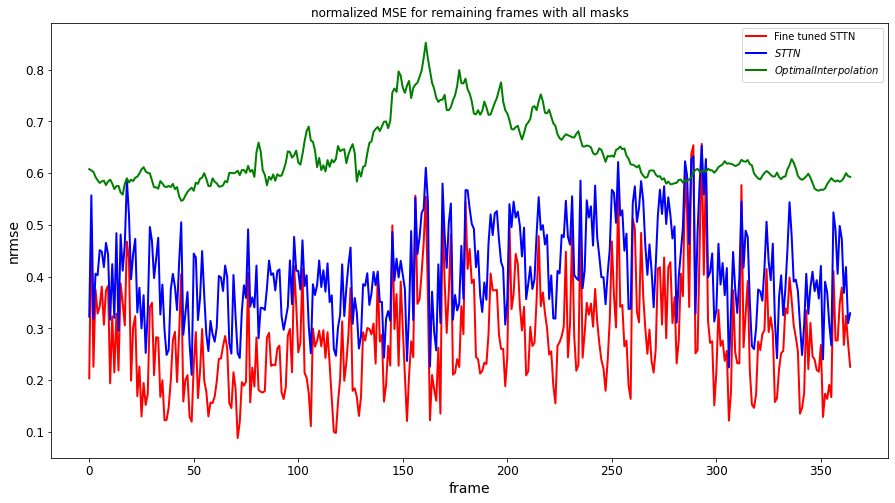

In [207]:
# plot nRMSE time series
N=len(nrmse)
plt.figure(figsize=(15,8))
plt.plot(range(N),nrmse_new_model,linestyle='solid',color='red',linewidth=2,label="Fine tuned STTN")
plt.plot(range(N),nrmse,linestyle='solid',color='blue',linewidth=2,label=r"$STTN$")
plt.plot(range(N),nrmse_oi,linestyle='solid',color='green',linewidth=2,label=r"$Optimal Interpolation$")


plt.title('normalized MSE for remaining frames with all masks')
plt.xlabel('frame')
plt.ylabel('nrmse')
plt.legend()
# plt.ylim(0,0.75)
plt.show()

In [239]:
nrmse_new_model.mean(), nrmse_new_model.std()

(0.28303279460490294, 0.10469803337279918)

In [241]:
nrmse_oi.mean(), nrmse_oi.std()

(0.6376107941457796, 0.06345270768682973)

In [240]:
nrmse.mean(), nrmse.std()

(0.4096321560390874, 0.09015831234195425)

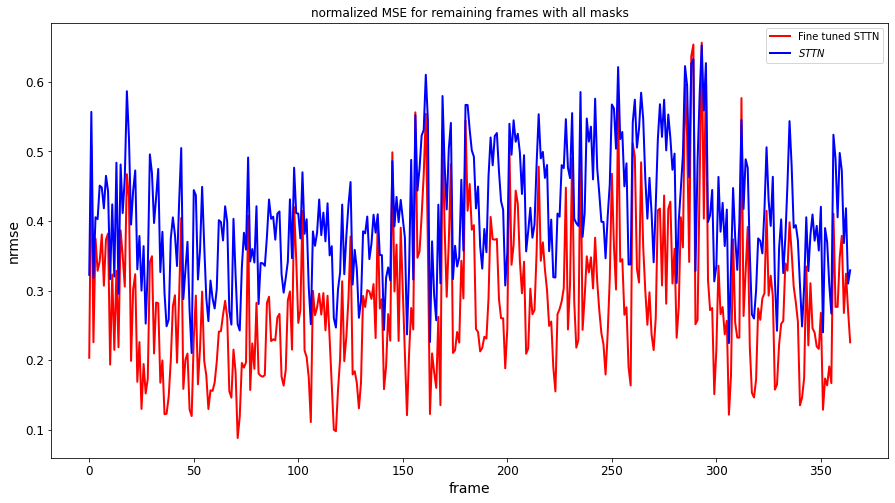

In [71]:
mean = nrmse.mean()
std = nrmse.std()

mean_f = nrmse_new_model.mean()
std_f = nrmse_new_model.std()

# plot nRMSE time series
N=len(nrmse)
plt.figure(figsize=(15,8))
plt.plot(range(N),nrmse_new_model,linestyle='solid',color='red',linewidth=2,label="Fine tuned STTN")
plt.plot(range(N),nrmse,linestyle='solid',color='blue',linewidth=2,label=r"$STTN$")

plt.title('normalized MSE for remaining frames with all masks')
plt.xlabel('frame')
plt.ylabel('nrmse')
plt.legend()
# plt.ylim(0,0.75)
plt.show()

In [75]:
print(nrmse_new_model.mean(), nrmse_new_model.std())

0.28303279460490294 0.10469803337279918


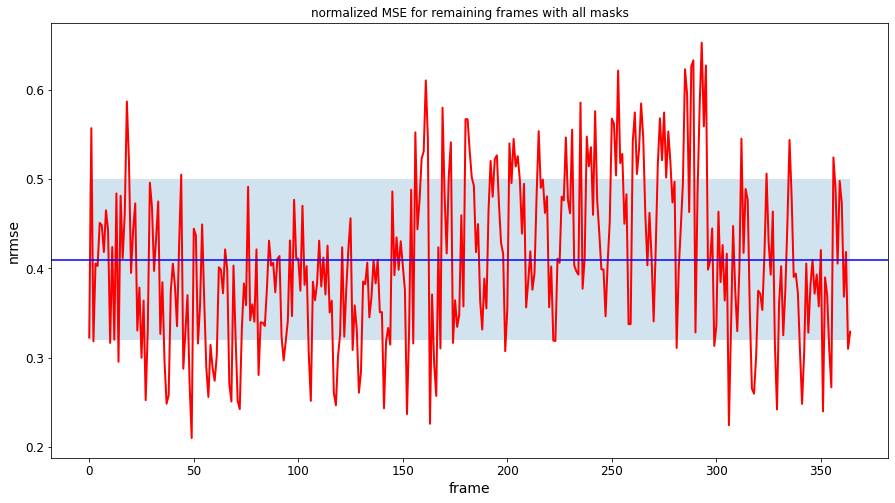

In [196]:

mean = nrmse.mean()
std = nrmse.std()
# plot nRMSE time series
N=len(nrmse)
plt.figure(figsize=(15,8))
plt.plot(range(N),nrmse,linestyle='solid',color='red',linewidth=2,label=r"$STTN$")
plt.axhline(y=mean, color='b', linestyle='-')
plt.fill_between(range(N), mean-std, mean+std, alpha=0.2)
plt.title('normalized MSE for remaining frames with all masks')
plt.xlabel('frame')
plt.ylabel('nrmse')
# plt.ylim(0,0.75)
plt.show()

In [ ]:
# stationnary masks ->

# cacher des frames 

# utiliser nos masques sur des videos youtube ->

# reconsistuer une seule image dans une video avec nos masques

# prendre du recul et decider une stratégie

# métrique : PSD 

In [216]:

output =transformed_ssh_oi #(1-masks)*feats
output_v=feats.squeeze(0).permute(0,2,3,1).cpu().detach().numpy()

In [217]:
factor = 255/(output_v[output_v>0].max()-output_v[output_v>0].min())

In [218]:
output_v = output_v*factor

In [219]:
frame_out = [output_v[i] for i in range(video_length)]

In [220]:
writer = cv2.VideoWriter(path+f"ssh_optimal_interpolation.mp4", cv2.VideoWriter_fourcc(*"mp4v"), default_fps, (w, h))
for f in range(video_length):
   
    #writer.write(np.array(transformed_ssh_oi[f]).astype(np.uint8))
    writer.write(cv2.cvtColor(np.array(frame_out[f]).astype(np.uint8), cv2.COLOR_BGR2RGB))
    
writer.release()
print('Finish in {}'.format(path+f"ssh_result_experiment{experiment}.mp4"))

Finish in Experiments/Experiment12/ssh_result_experiment12.mp4


In [72]:
writer = cv2.VideoWriter(path+f"ssh_result_experiment{experiment}.mp4", cv2.VideoWriter_fourcc(*"mp4v"), default_fps, (w, h))
for f in range(video_length):
    comp = np.array(comp_frames[f]).astype(
        np.uint8)*binary_masks[f] + frames[f] * (1-binary_masks[f])
    writer.write(cv2.cvtColor(np.array(comp).astype(np.uint8), cv2.COLOR_BGR2RGB))
writer.release()
print('Finish in {}'.format(path+f"ssh_result_experiment{experiment}.mp4"))

Finish in Experiments/Experiment12/ssh_result_experiment12.mp4


- Lancer le modele sur nos données avec les masques de l'auteur
- enlever les frames avec un masque tres grand
- fine tuner sur differentes videos avec nos masques 
- documenter et rédiger les différentes experiences

## Visualize results

In [47]:
# dataset_path = '../datasets/'
dataset_path = '/mnt/groupadiag302/Transformers/Project_UEH_data/datasets/'
lon = xr.open_dataset(dataset_path + "ref.nc").lon.values[5:197]
lat = xr.open_dataset(dataset_path + "ref.nc").lat.values[5:197]
extent = [np.min(lon),np.max(lon),np.min(lat),np.max(lat)]

---------- frame 0--------------


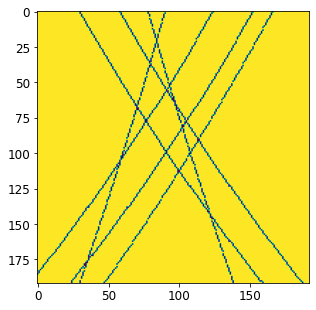

---------- frame 1--------------


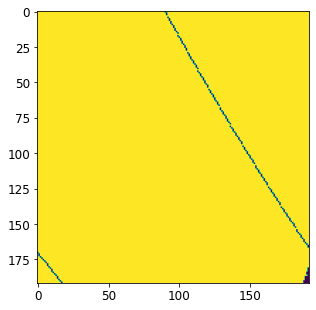

---------- frame 2--------------


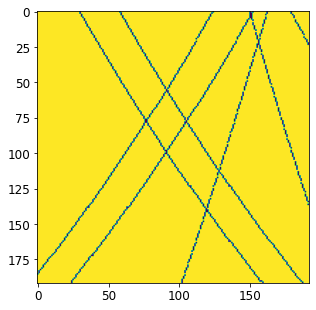

---------- frame 3--------------


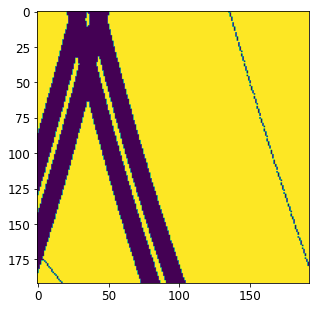

---------- frame 4--------------


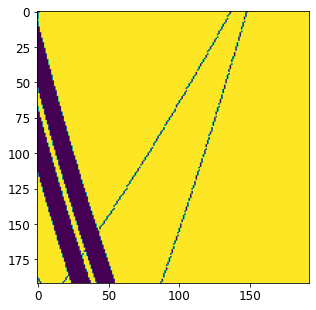

---------- frame 5--------------


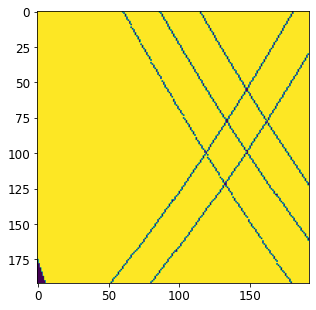

---------- frame 6--------------


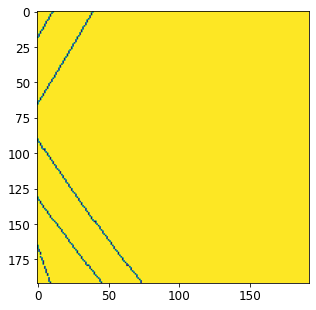

---------- frame 7--------------


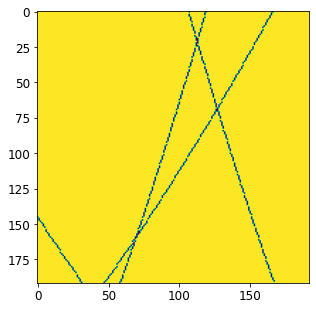

---------- frame 8--------------


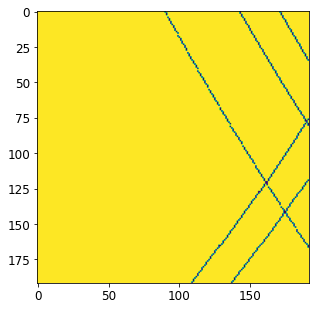

---------- frame 9--------------


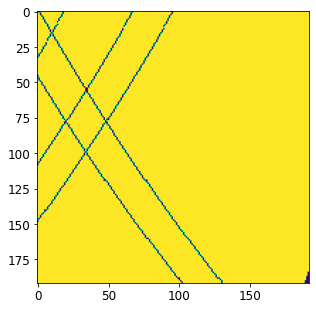

---------- frame 10--------------


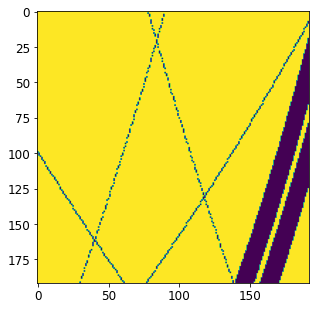

---------- frame 11--------------


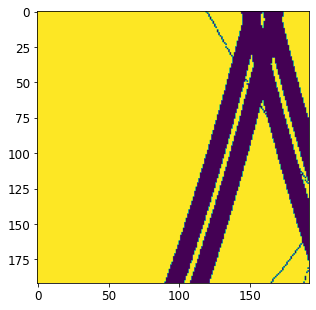

---------- frame 12--------------


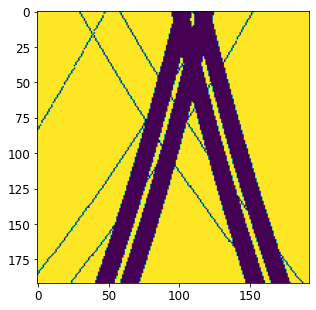

---------- frame 13--------------


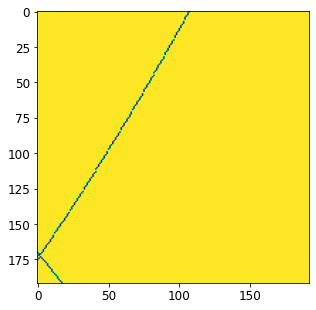

---------- frame 14--------------


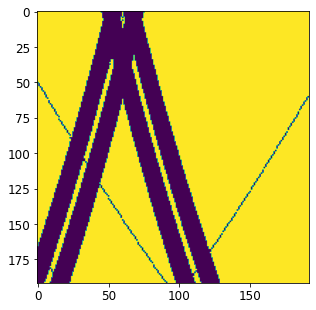

---------- frame 15--------------


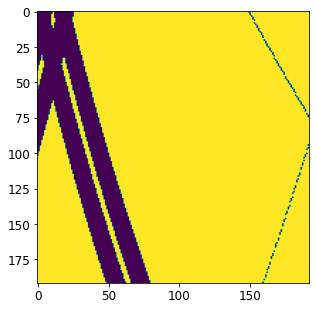

---------- frame 16--------------


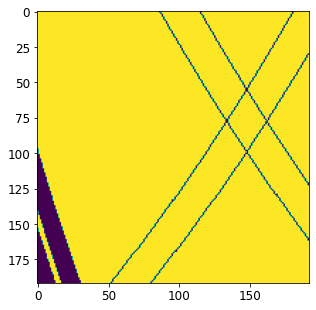

---------- frame 17--------------


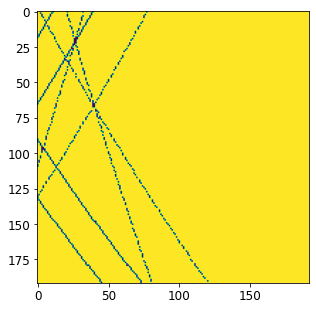

---------- frame 18--------------


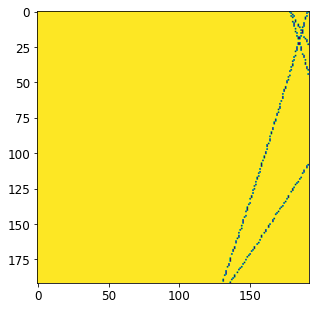

---------- frame 19--------------


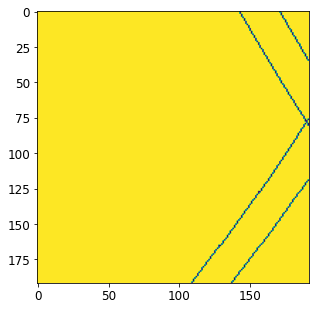

---------- frame 20--------------


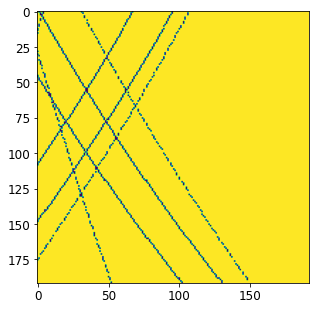

---------- frame 21--------------


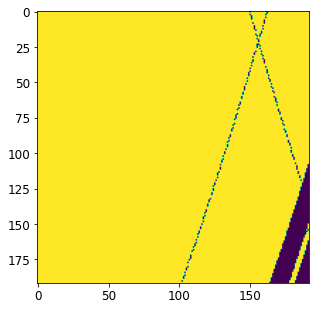

---------- frame 22--------------


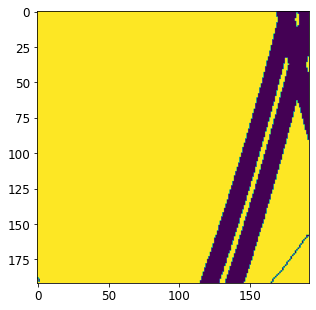

---------- frame 23--------------


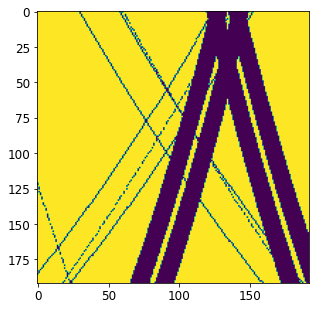

---------- frame 24--------------


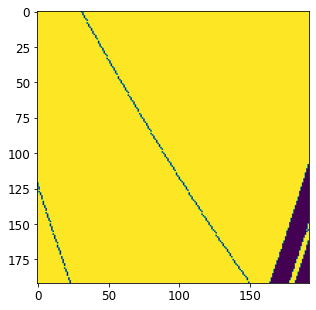

---------- frame 25--------------


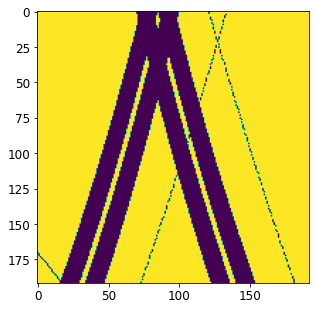

---------- frame 26--------------


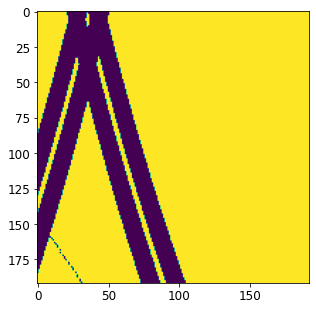

---------- frame 27--------------


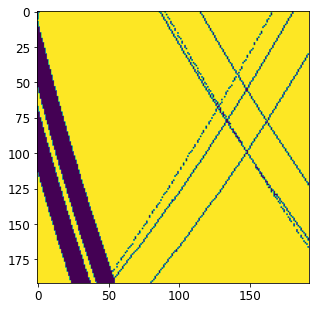

---------- frame 28--------------


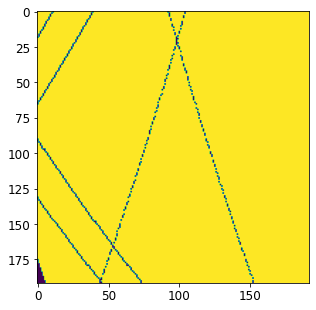

---------- frame 29--------------


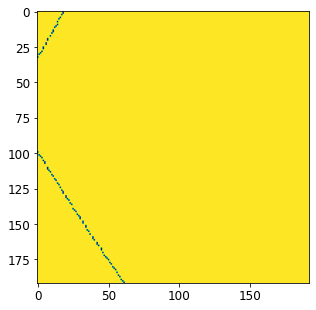

---------- frame 30--------------


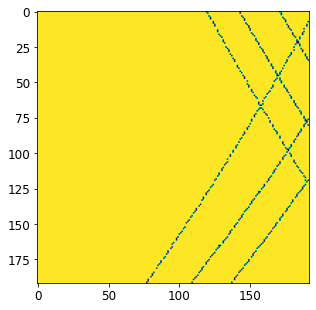

---------- frame 31--------------


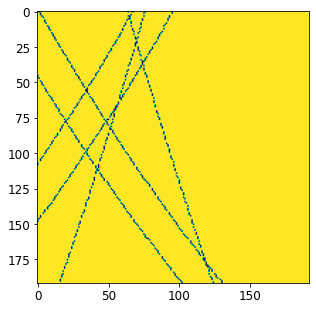

---------- frame 32--------------


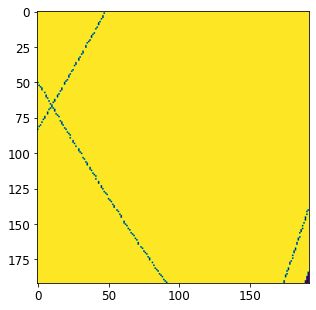

---------- frame 33--------------


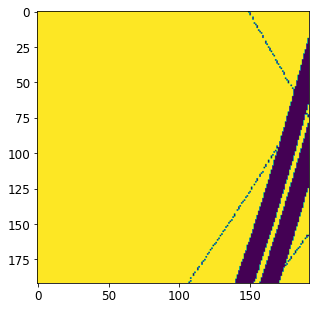

---------- frame 34--------------


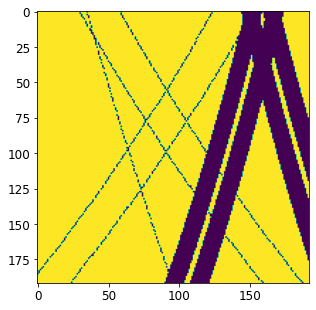

---------- frame 35--------------


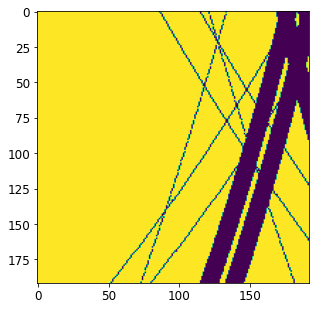

---------- frame 36--------------


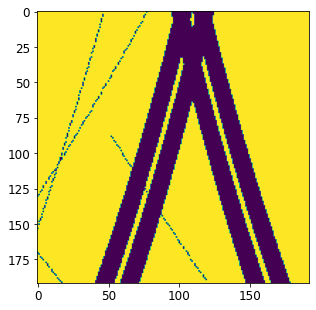

---------- frame 37--------------


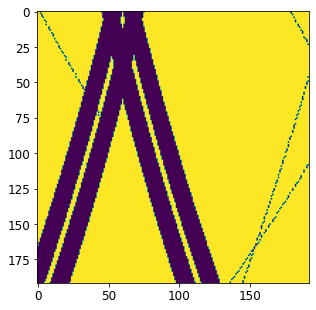

---------- frame 38--------------


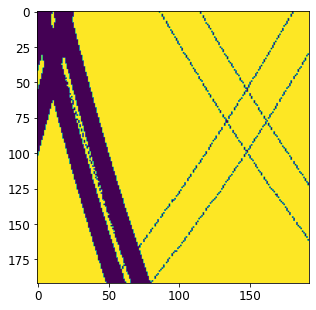

---------- frame 39--------------


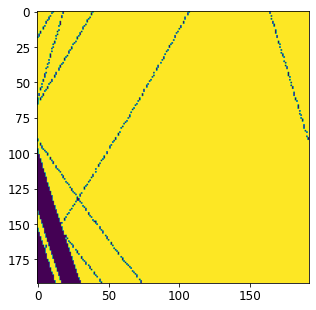

---------- frame 40--------------


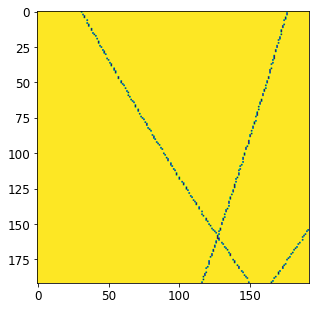

---------- frame 41--------------


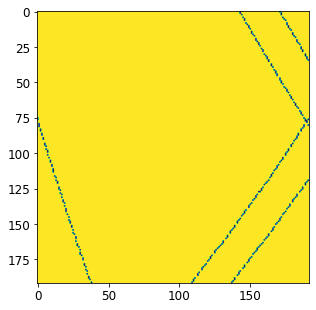

---------- frame 42--------------


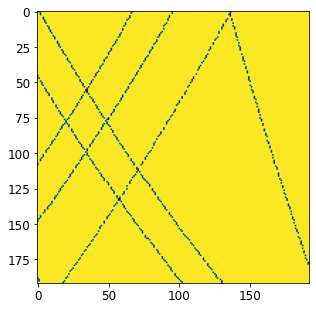

---------- frame 43--------------


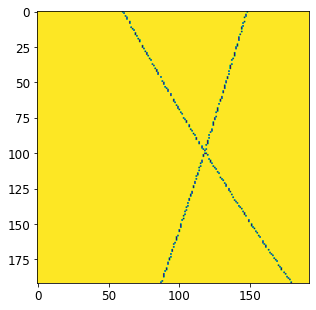

---------- frame 44--------------


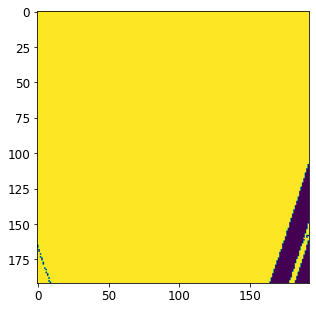

---------- frame 45--------------


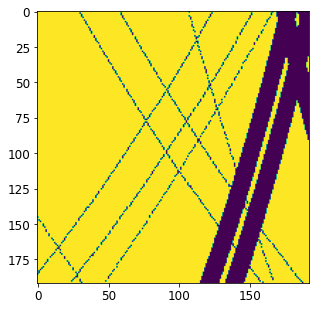

---------- frame 46--------------


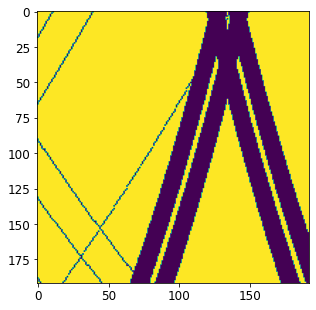

---------- frame 47--------------


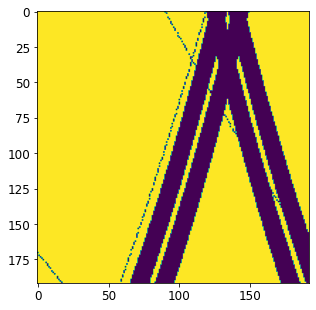

---------- frame 48--------------


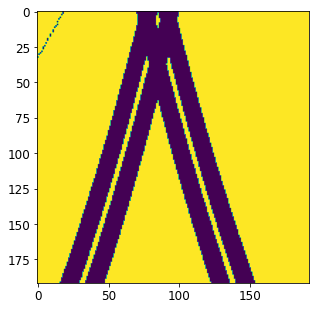

---------- frame 49--------------


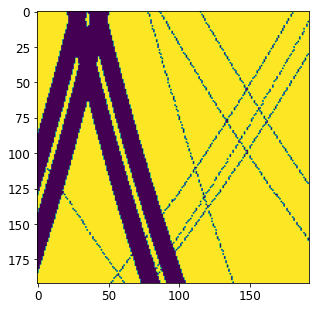

---------- frame 50--------------


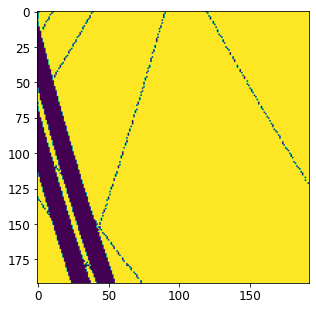

---------- frame 51--------------


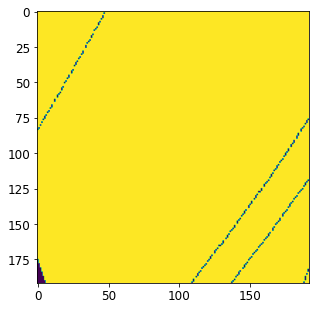

---------- frame 52--------------


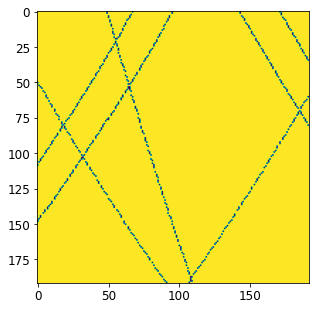

---------- frame 53--------------


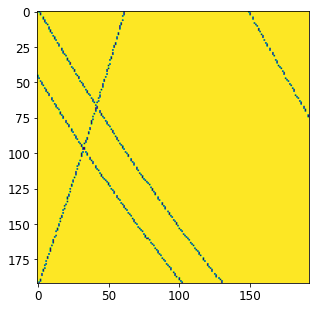

---------- frame 54--------------


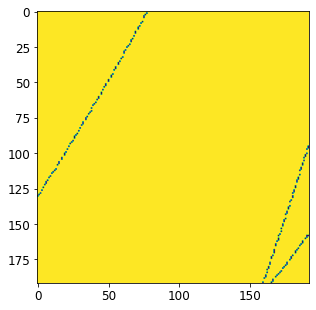

---------- frame 55--------------


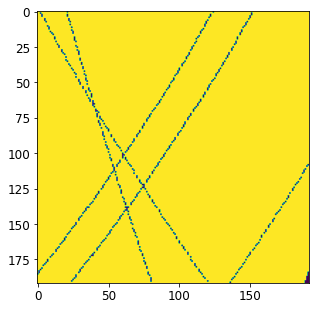

---------- frame 56--------------


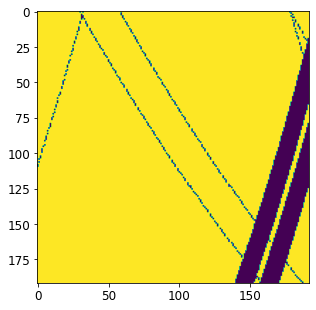

---------- frame 57--------------


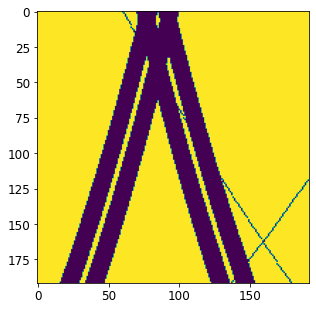

---------- frame 58--------------


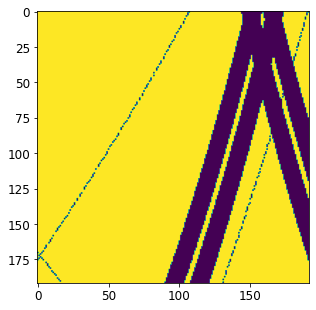

---------- frame 59--------------


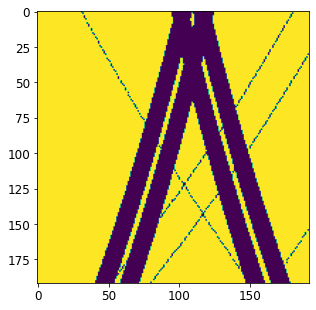

---------- frame 60--------------


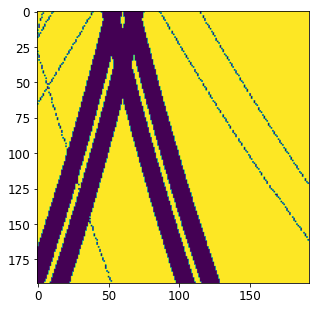

---------- frame 61--------------


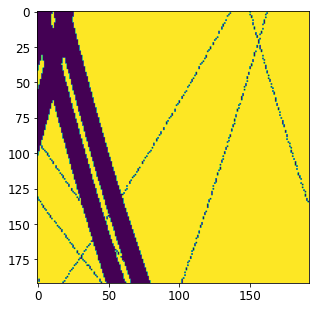

---------- frame 62--------------


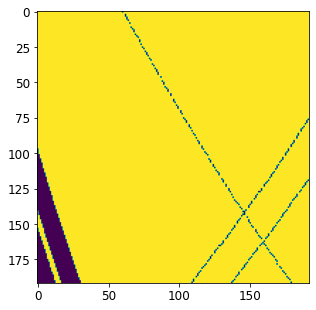

---------- frame 63--------------


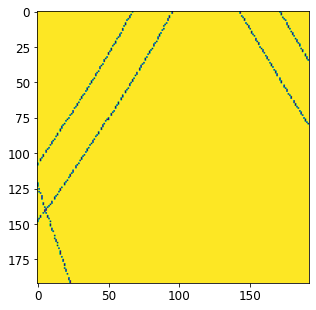

---------- frame 64--------------


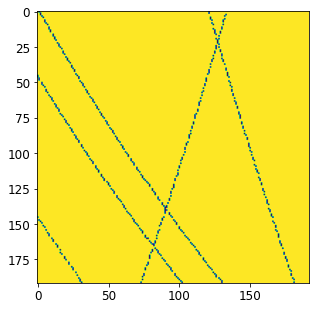

---------- frame 65--------------


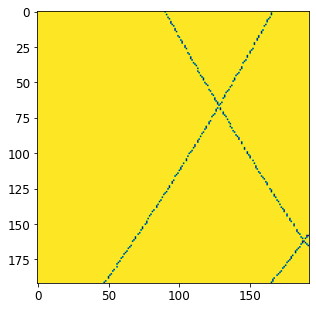

---------- frame 66--------------


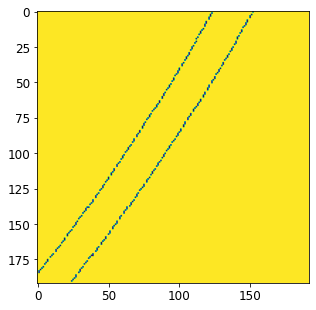

---------- frame 67--------------


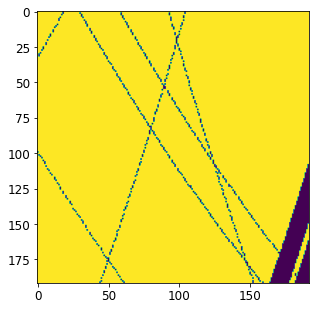

---------- frame 68--------------


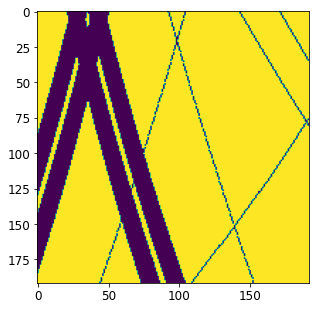

---------- frame 69--------------


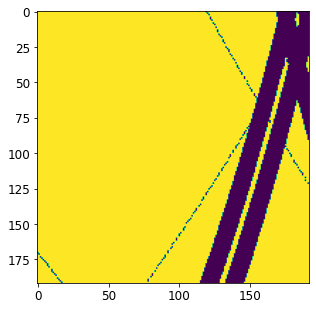

---------- frame 70--------------


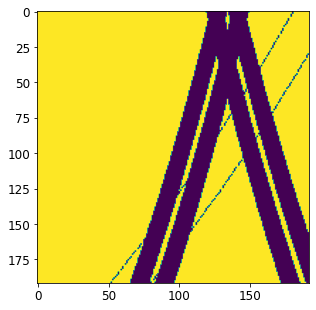

---------- frame 71--------------


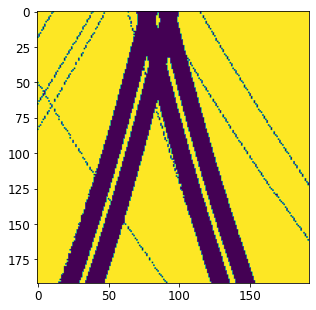

---------- frame 72--------------


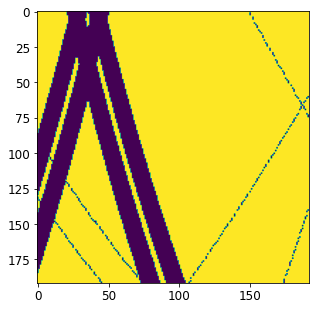

---------- frame 73--------------


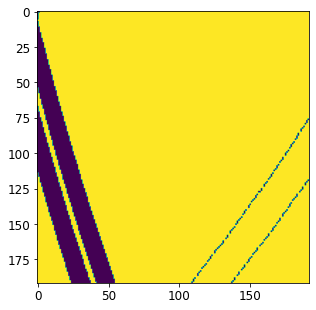

---------- frame 74--------------


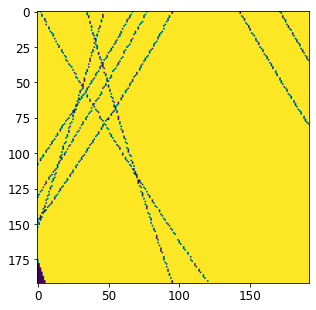

---------- frame 75--------------


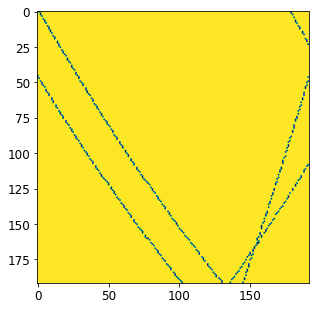

---------- frame 76--------------


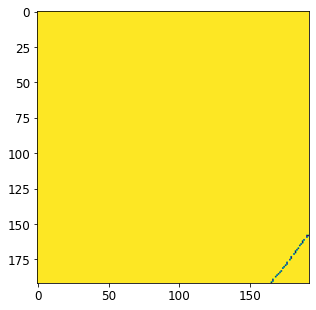

---------- frame 77--------------


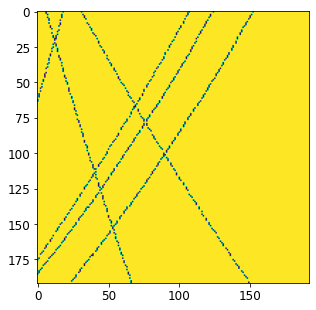

---------- frame 78--------------


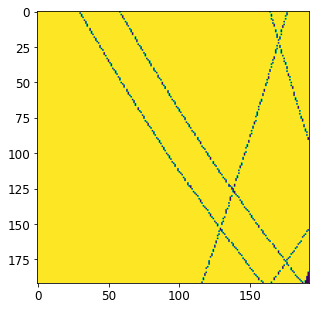

---------- frame 79--------------


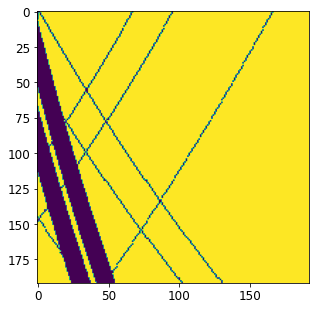

---------- frame 80--------------


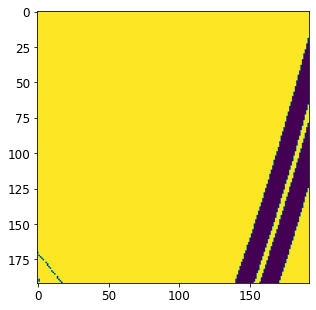

---------- frame 81--------------


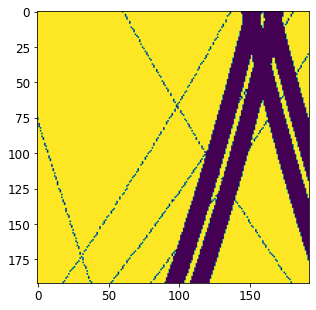

---------- frame 82--------------


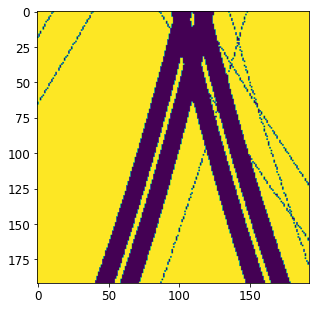

---------- frame 83--------------


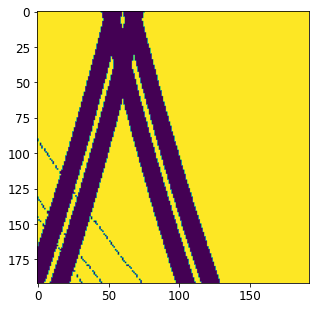

---------- frame 84--------------


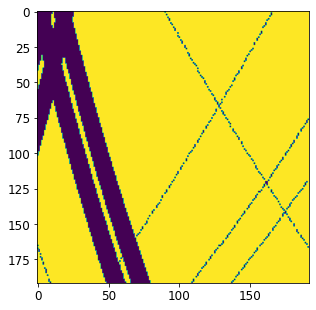

---------- frame 85--------------


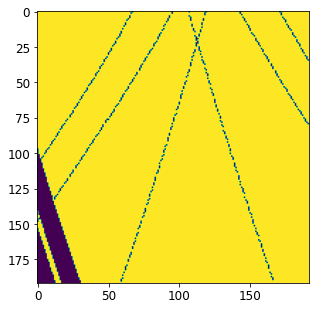

---------- frame 86--------------


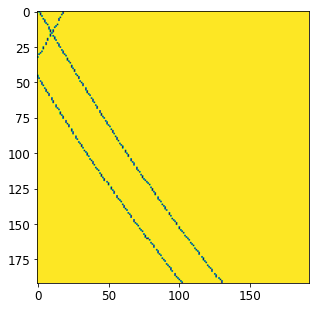

---------- frame 87--------------


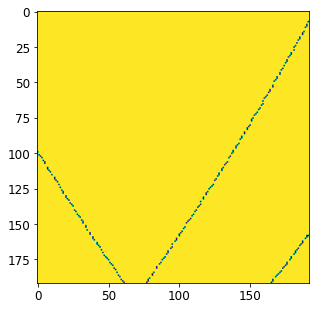

---------- frame 88--------------


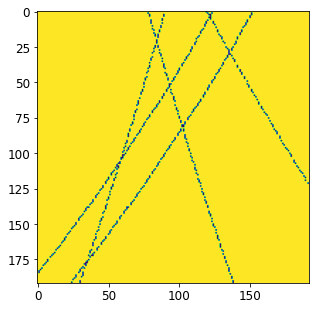

---------- frame 89--------------


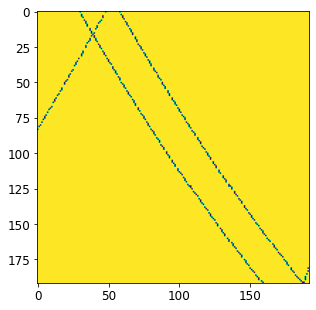

---------- frame 90--------------


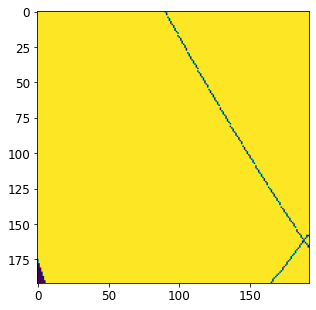

---------- frame 91--------------


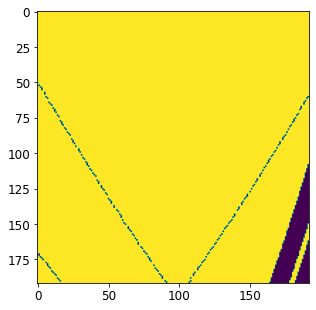

---------- frame 92--------------


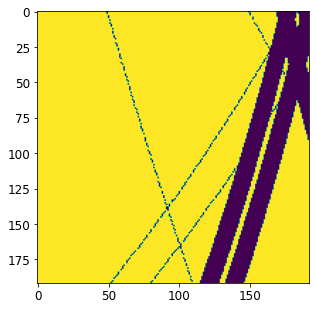

---------- frame 93--------------


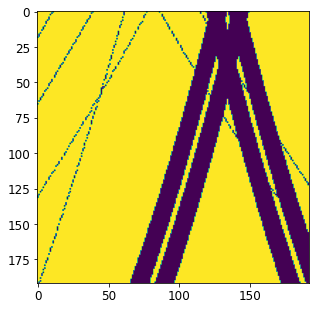

---------- frame 94--------------


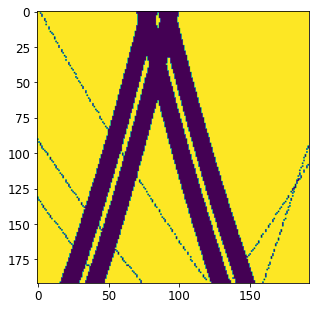

---------- frame 95--------------


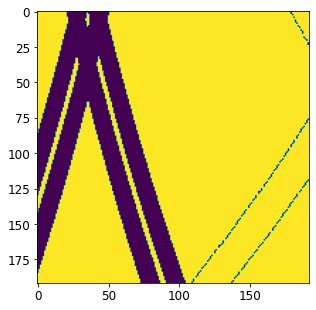

---------- frame 96--------------


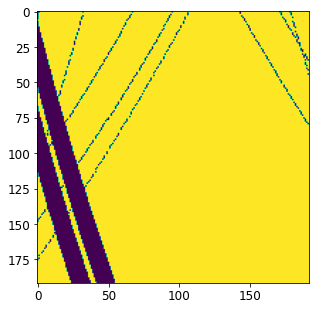

---------- frame 97--------------


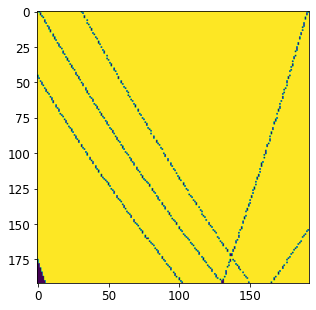

---------- frame 98--------------


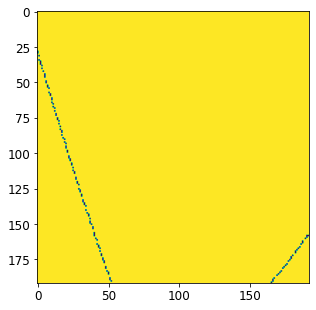

---------- frame 99--------------


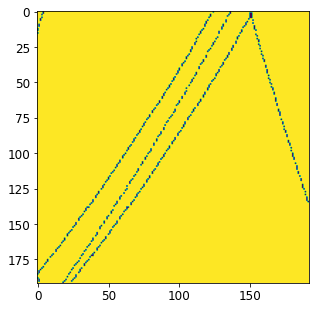

---------- frame 100--------------


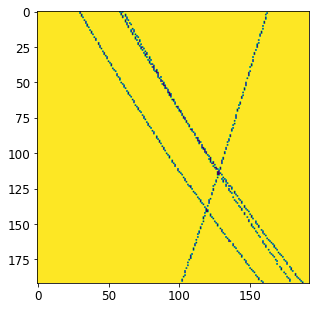

---------- frame 101--------------


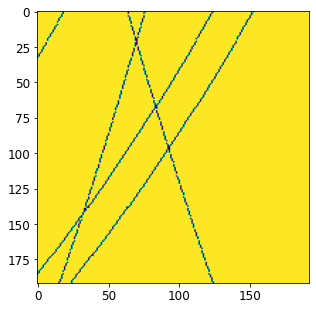

---------- frame 102--------------


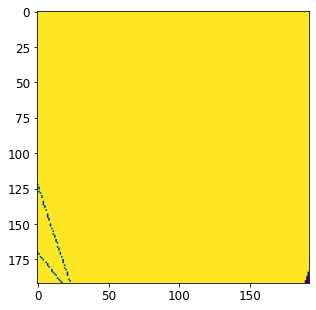

---------- frame 103--------------


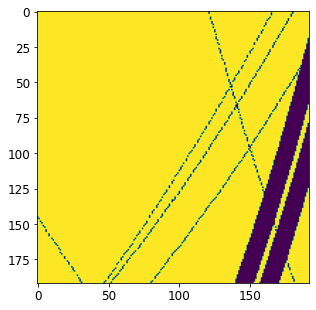

---------- frame 104--------------


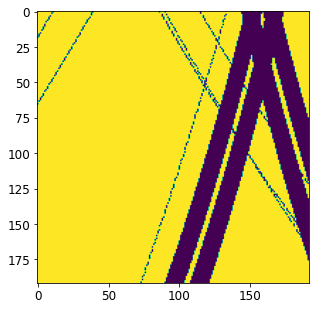

---------- frame 105--------------


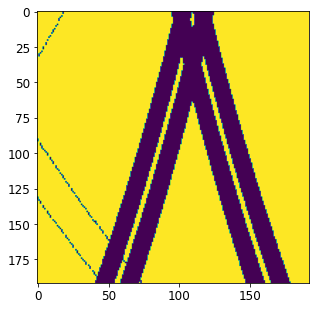

---------- frame 106--------------


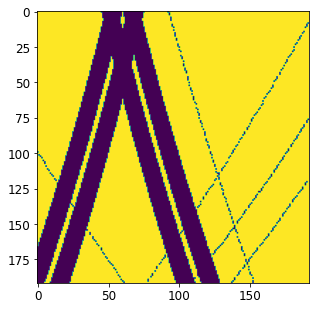

---------- frame 107--------------


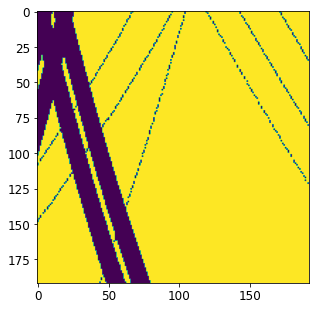

---------- frame 108--------------


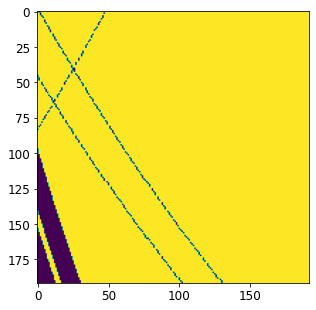

---------- frame 109--------------


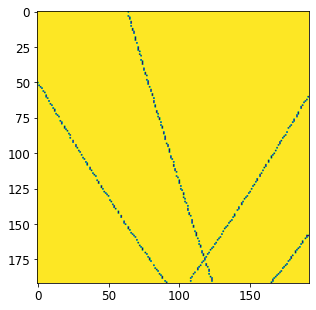

---------- frame 110--------------


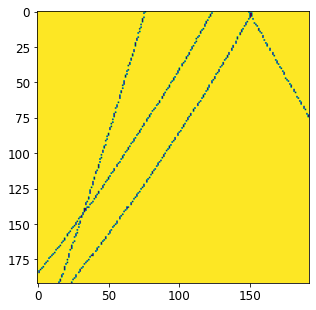

---------- frame 111--------------


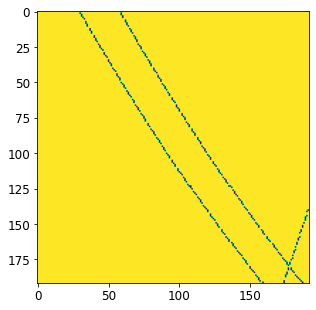

---------- frame 112--------------


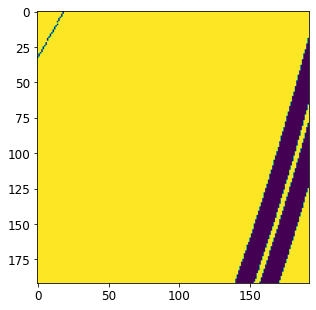

---------- frame 113--------------


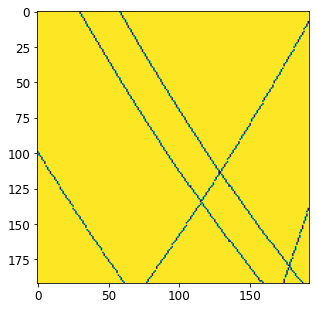

---------- frame 114--------------


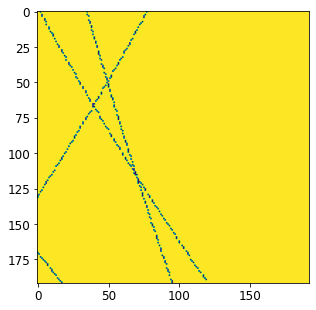

---------- frame 115--------------


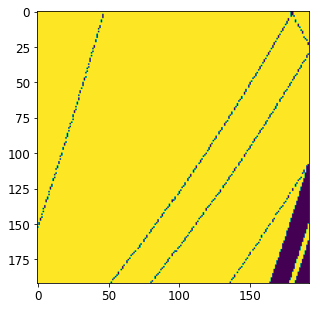

---------- frame 116--------------


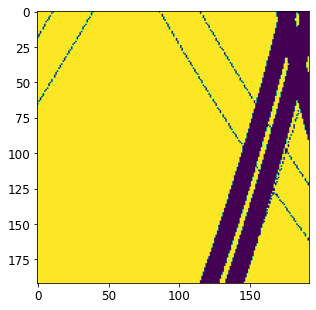

---------- frame 117--------------


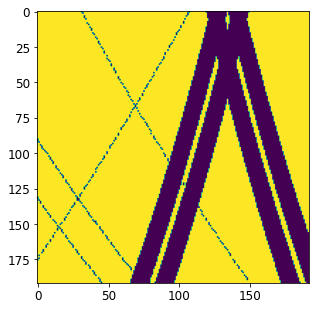

---------- frame 118--------------


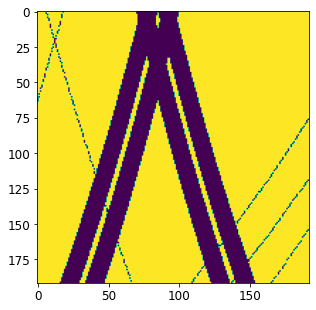

---------- frame 119--------------


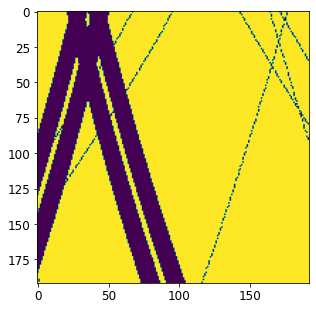

---------- frame 120--------------


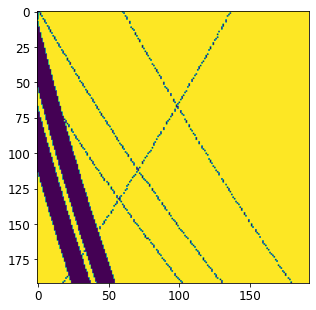

---------- frame 121--------------


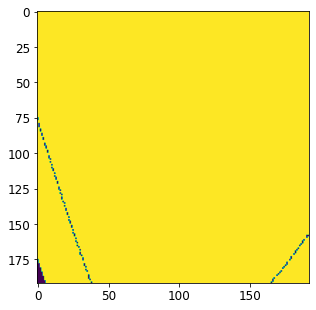

---------- frame 122--------------


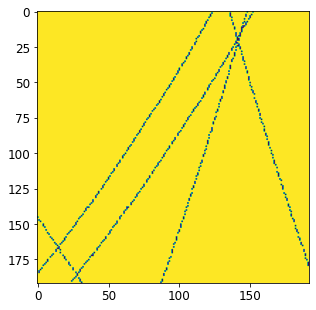

---------- frame 123--------------


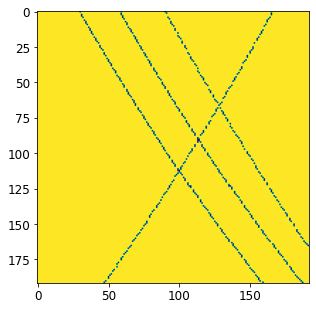

---------- frame 124--------------


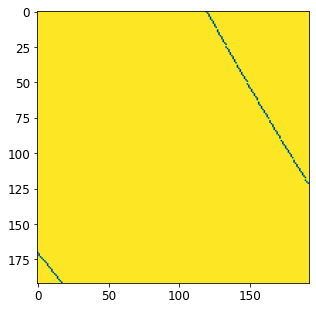

---------- frame 125--------------


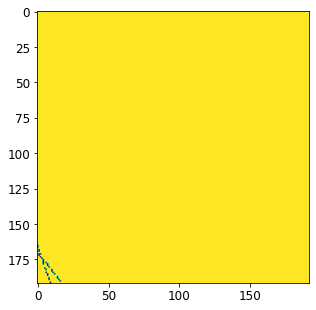

---------- frame 126--------------


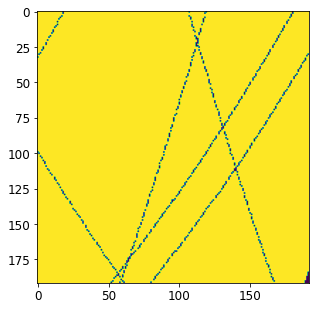

---------- frame 127--------------


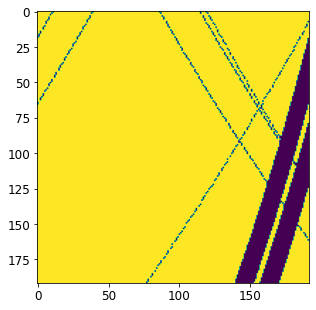

---------- frame 128--------------


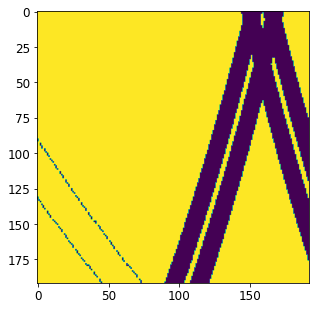

---------- frame 129--------------


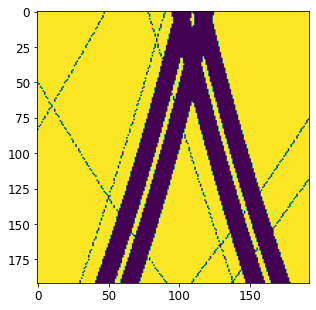

---------- frame 130--------------


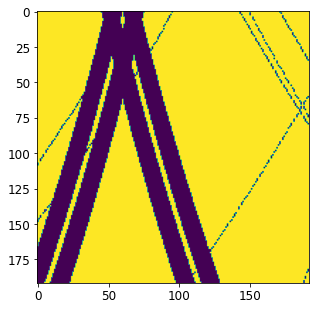

---------- frame 131--------------


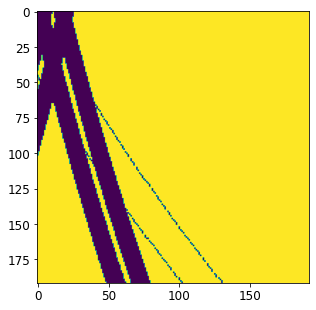

---------- frame 132--------------


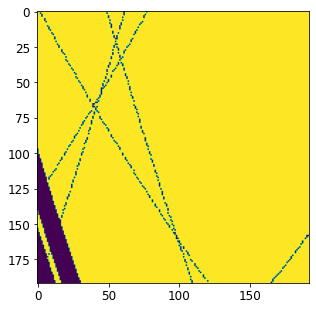

---------- frame 133--------------


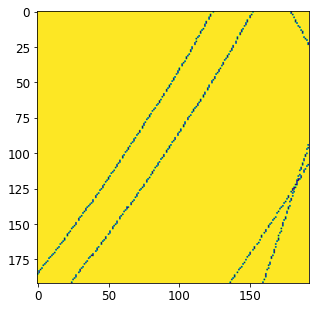

---------- frame 134--------------


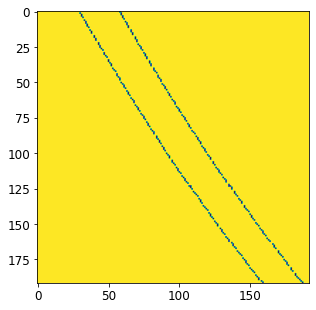

---------- frame 135--------------


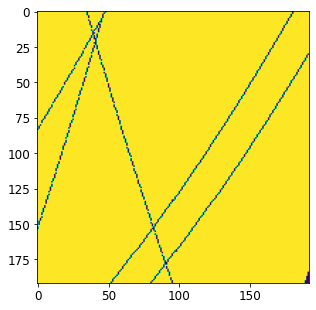

---------- frame 136--------------


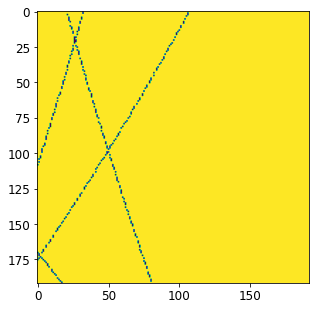

---------- frame 137--------------


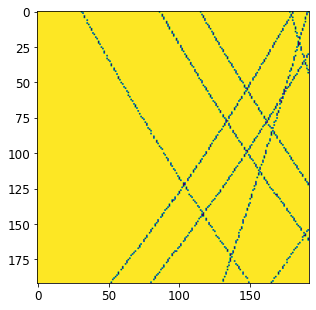

---------- frame 138--------------


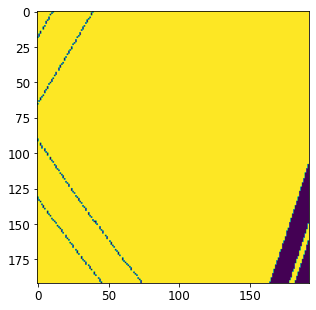

---------- frame 139--------------


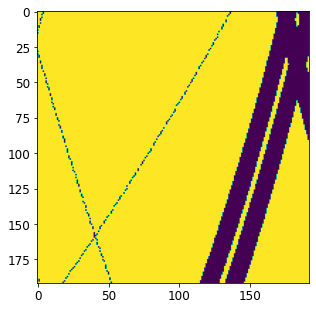

---------- frame 140--------------


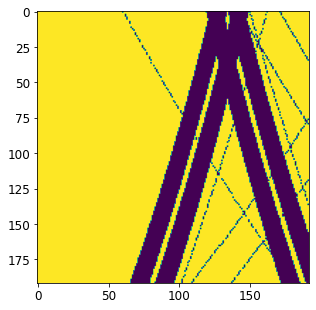

---------- frame 141--------------


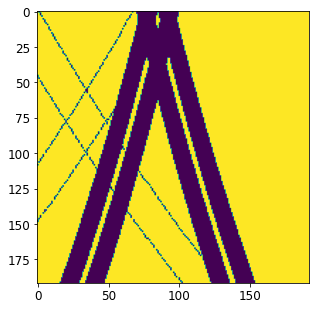

---------- frame 142--------------


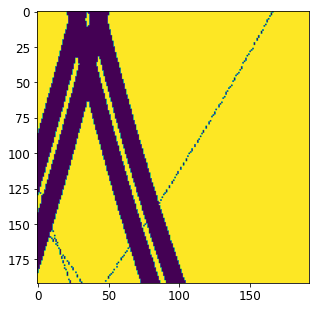

---------- frame 143--------------


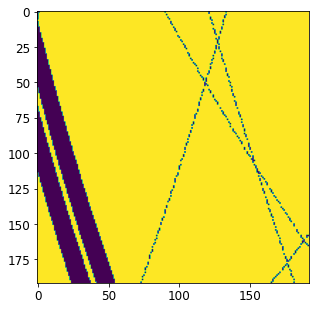

---------- frame 144--------------


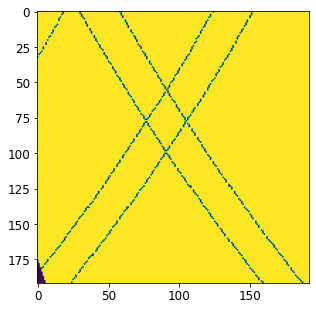

---------- frame 145--------------


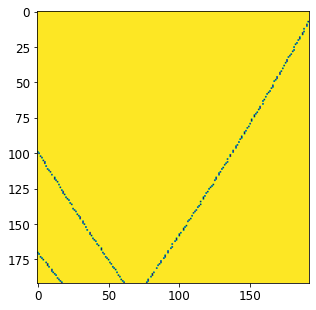

---------- frame 146--------------


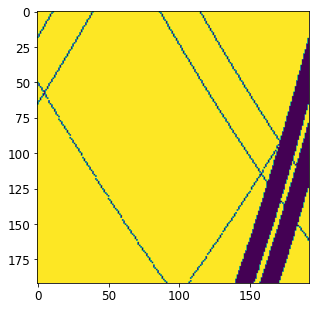

---------- frame 147--------------


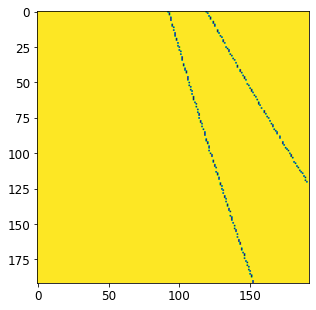

---------- frame 148--------------


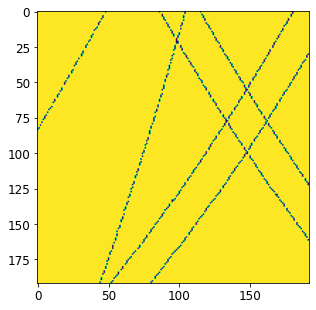

---------- frame 149--------------


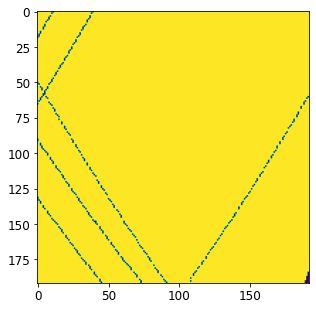

---------- frame 150--------------


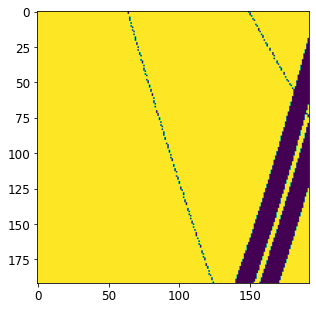

---------- frame 151--------------


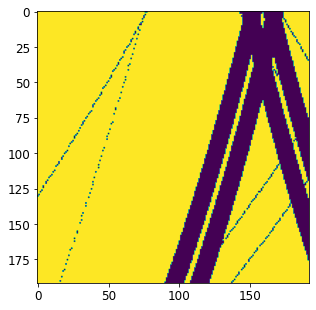

---------- frame 152--------------


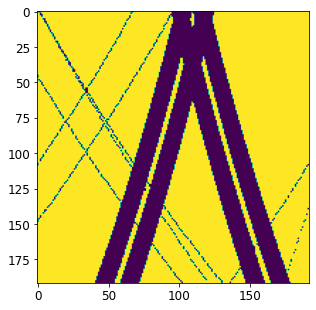

---------- frame 153--------------


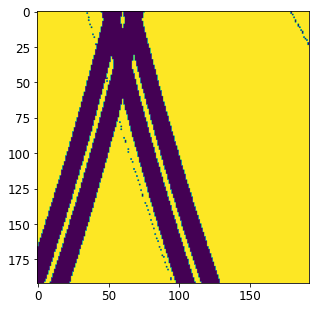

---------- frame 154--------------


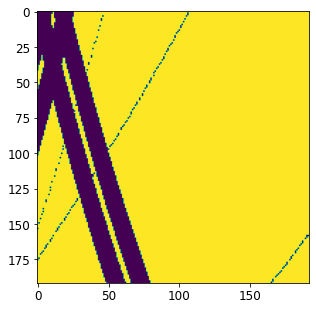

---------- frame 155--------------


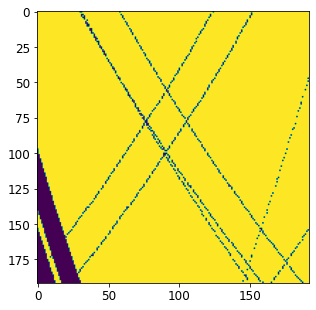

---------- frame 156--------------


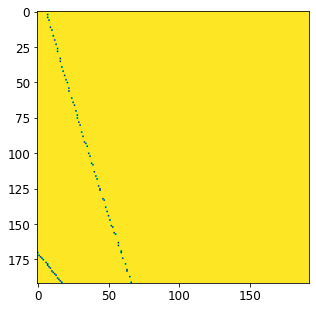

---------- frame 157--------------


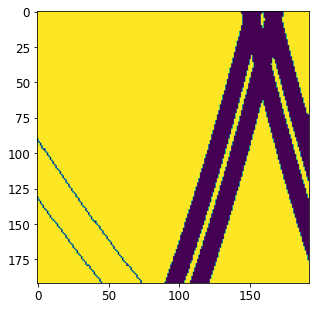

---------- frame 158--------------


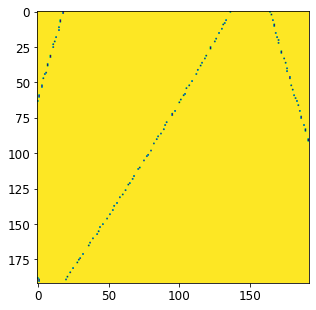

---------- frame 159--------------


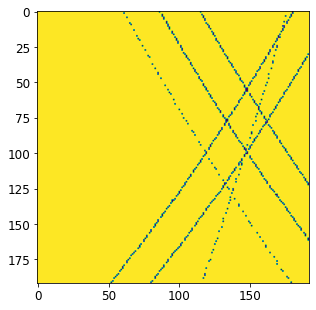

---------- frame 160--------------


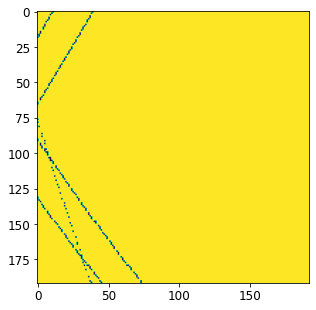

---------- frame 161--------------


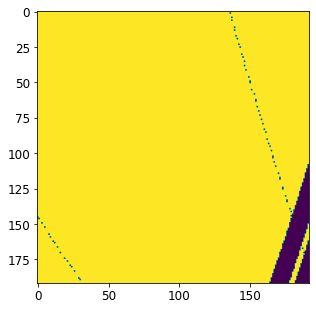

---------- frame 162--------------


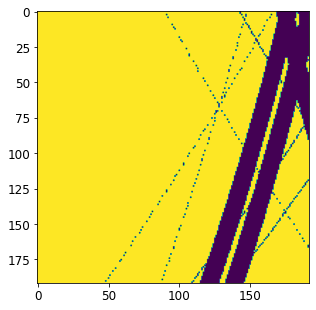

---------- frame 163--------------


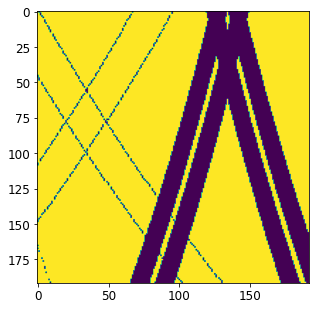

---------- frame 164--------------


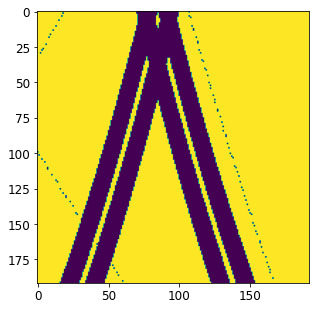

---------- frame 165--------------


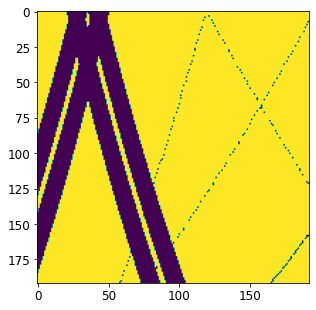

---------- frame 166--------------


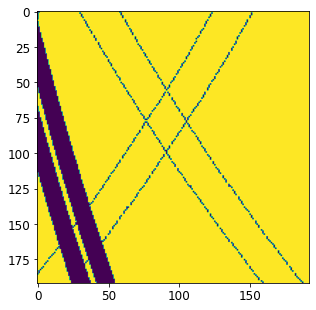

---------- frame 167--------------


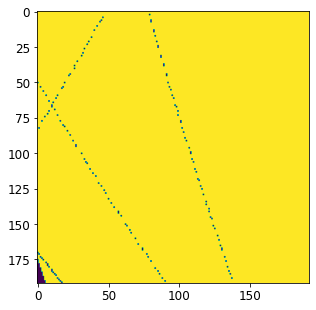

---------- frame 168--------------


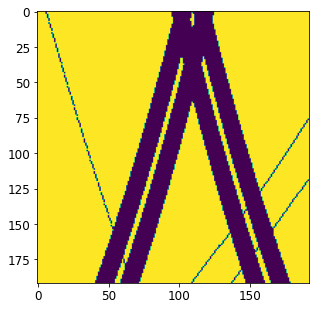

---------- frame 169--------------


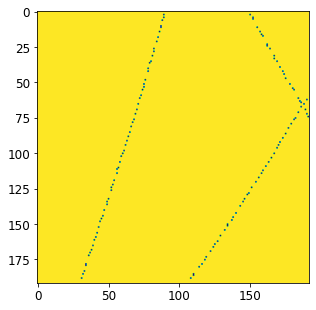

---------- frame 170--------------


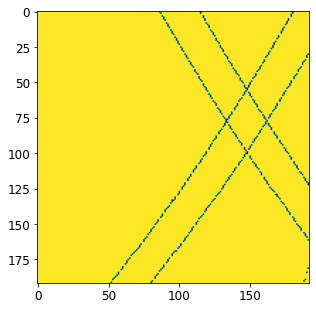

---------- frame 171--------------


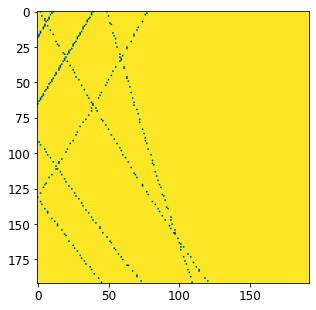

---------- frame 172--------------


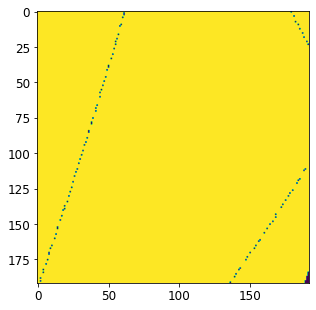

---------- frame 173--------------


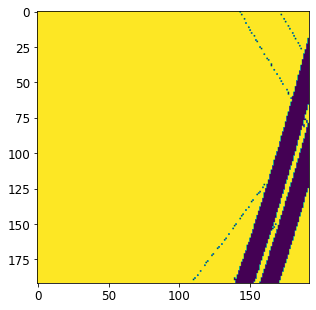

---------- frame 174--------------


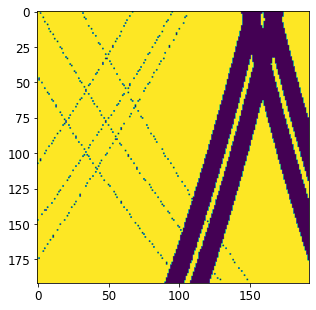

---------- frame 175--------------


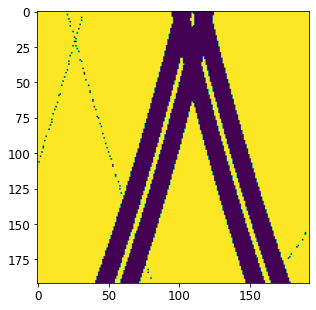

---------- frame 176--------------


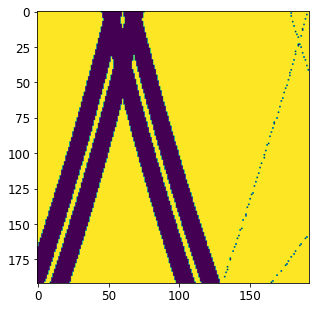

---------- frame 177--------------


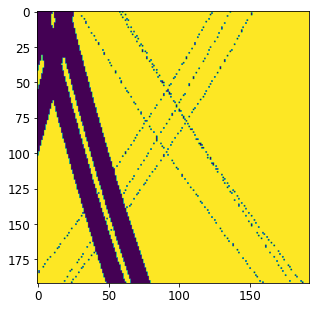

---------- frame 178--------------


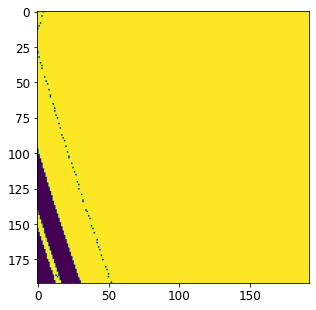

---------- frame 179--------------


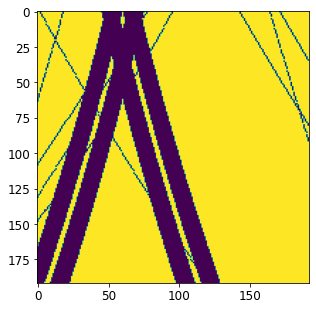

---------- frame 180--------------


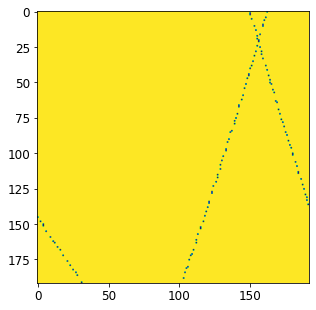

---------- frame 181--------------


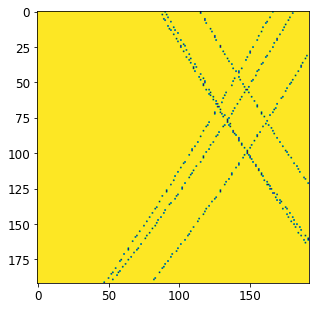

---------- frame 182--------------


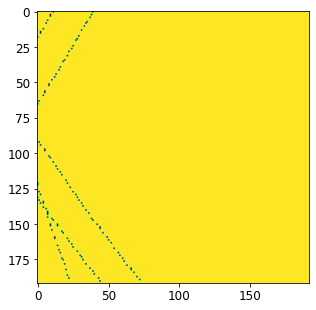

---------- frame 183--------------


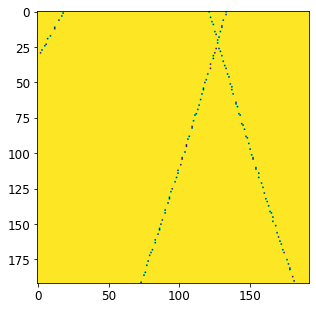

---------- frame 184--------------


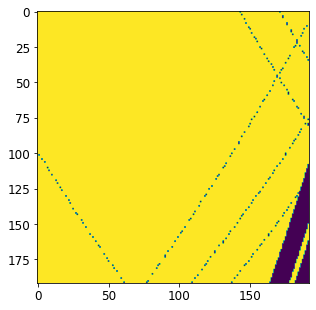

---------- frame 185--------------


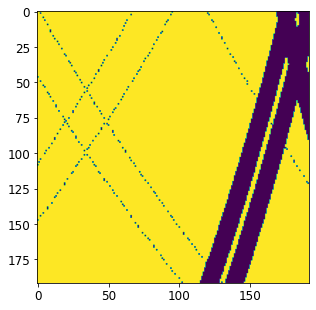

---------- frame 186--------------


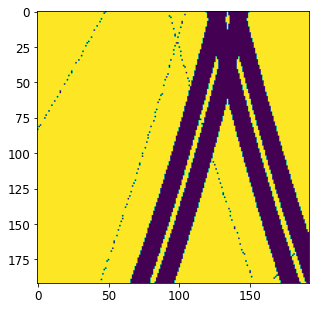

---------- frame 187--------------


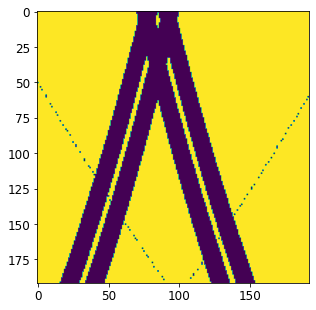

---------- frame 188--------------


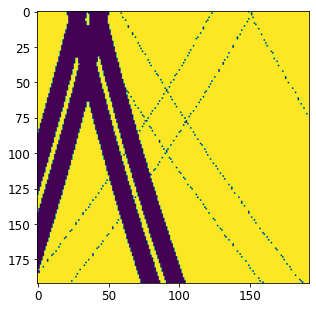

---------- frame 189--------------


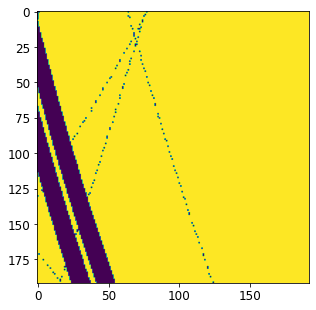

---------- frame 190--------------


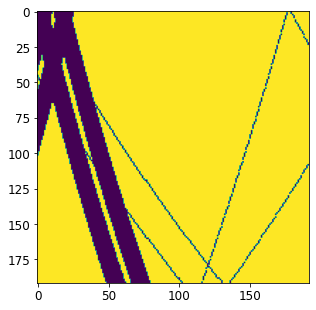

---------- frame 191--------------


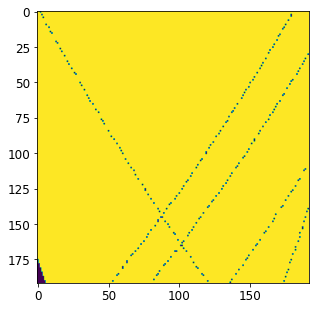

---------- frame 192--------------


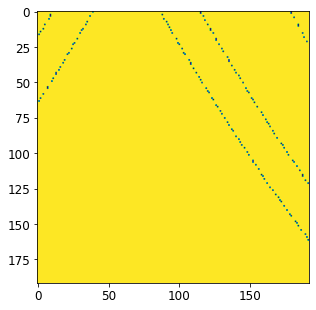

---------- frame 193--------------


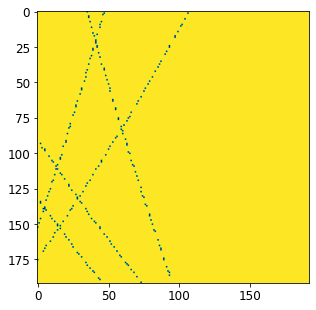

---------- frame 194--------------


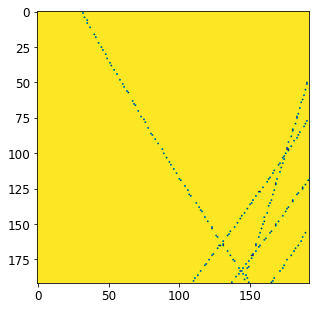

---------- frame 195--------------


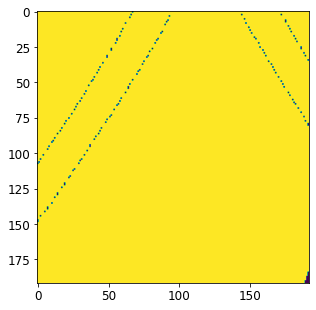

---------- frame 196--------------


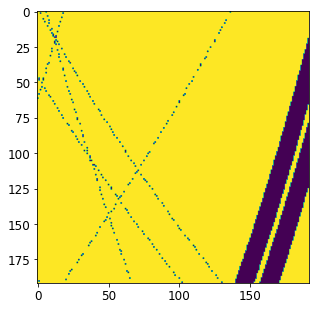

---------- frame 197--------------


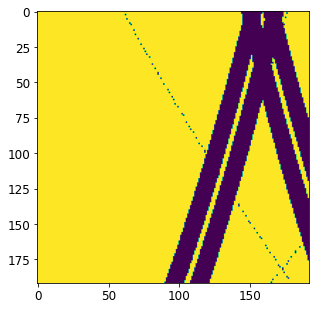

---------- frame 198--------------


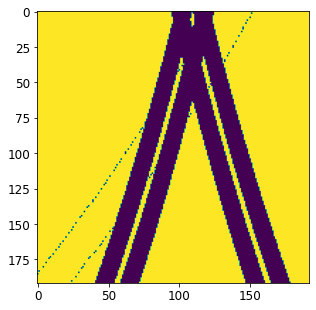

---------- frame 199--------------


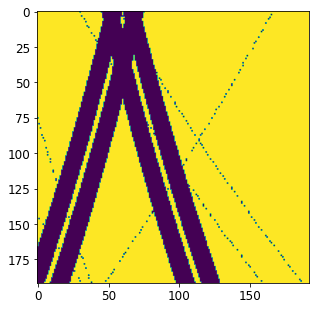

---------- frame 200--------------


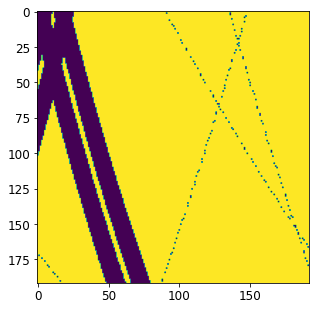

---------- frame 201--------------


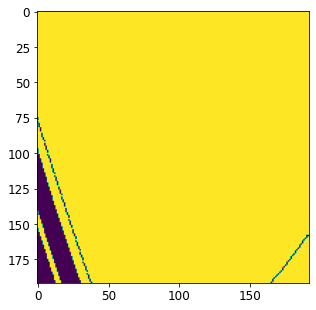

---------- frame 202--------------


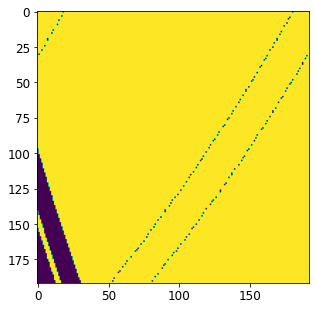

---------- frame 203--------------


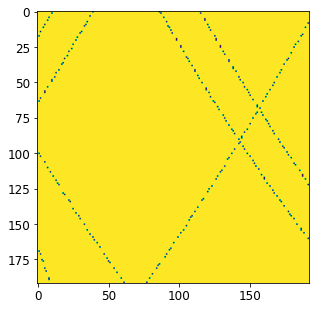

---------- frame 204--------------


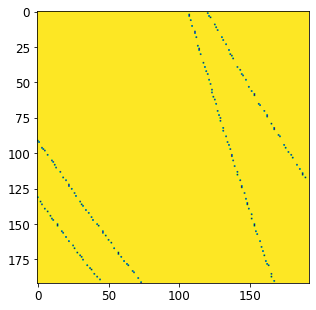

---------- frame 205--------------


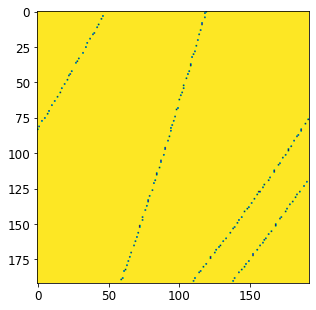

---------- frame 206--------------


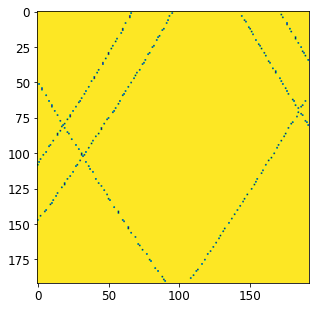

---------- frame 207--------------


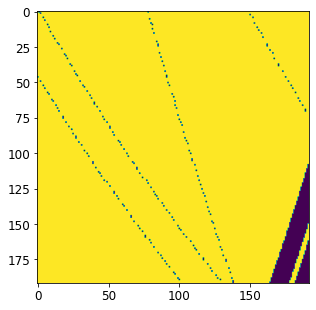

---------- frame 208--------------


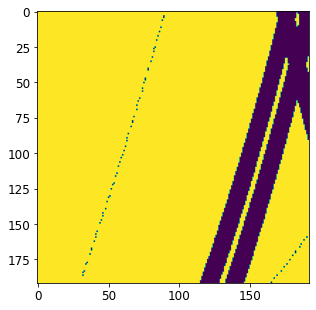

---------- frame 209--------------


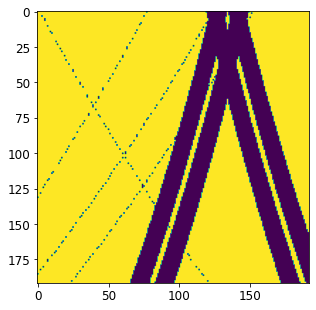

---------- frame 210--------------


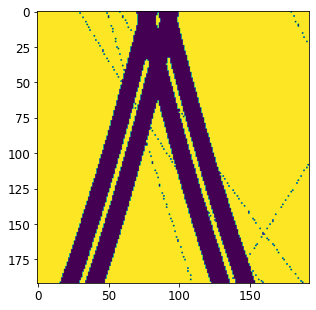

---------- frame 211--------------


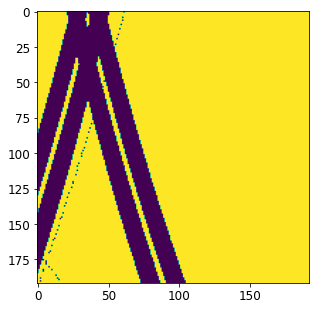

---------- frame 212--------------


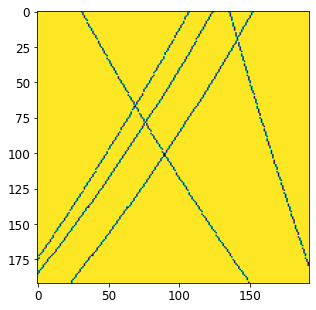

---------- frame 213--------------


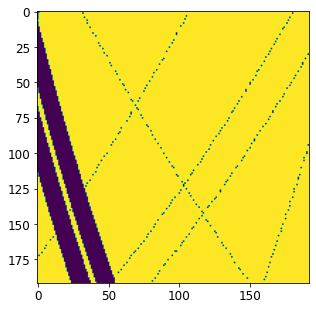

---------- frame 214--------------


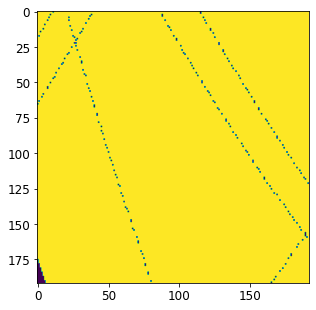

---------- frame 215--------------


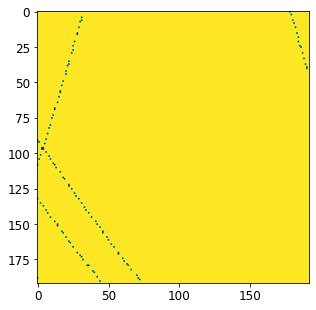

---------- frame 216--------------


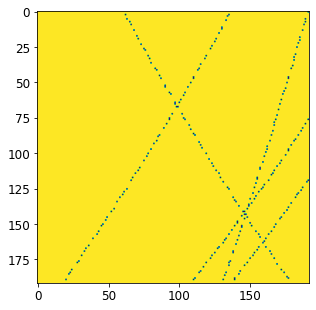

---------- frame 217--------------


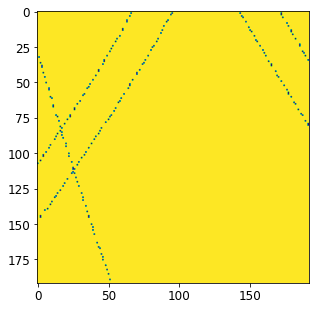

---------- frame 218--------------


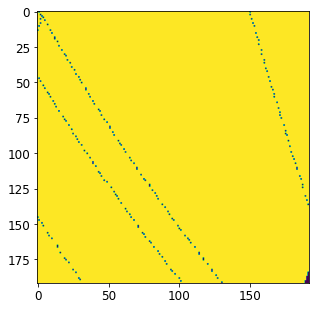

---------- frame 219--------------


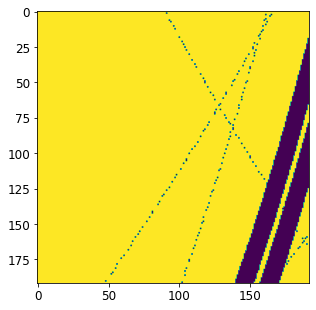

---------- frame 220--------------


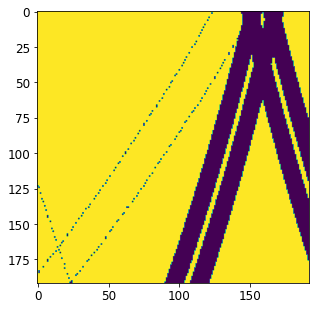

---------- frame 221--------------


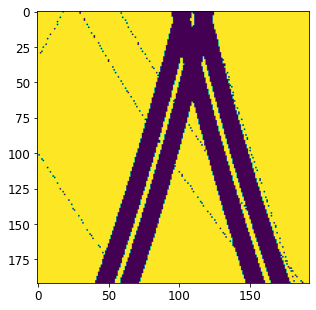

---------- frame 222--------------


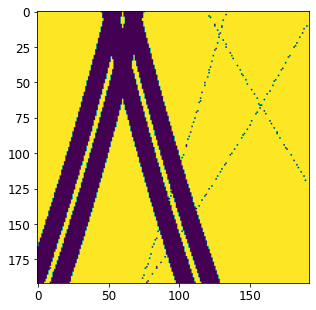

---------- frame 223--------------


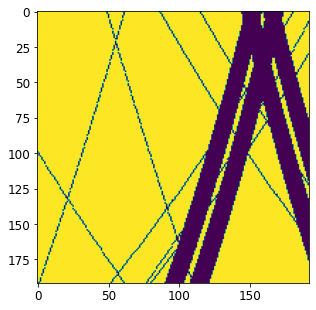

---------- frame 224--------------


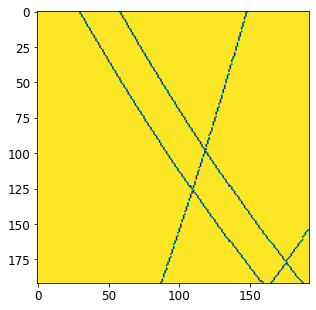

---------- frame 225--------------


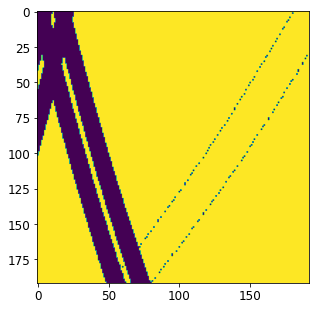

---------- frame 226--------------


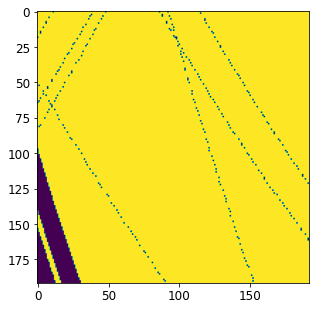

---------- frame 227--------------


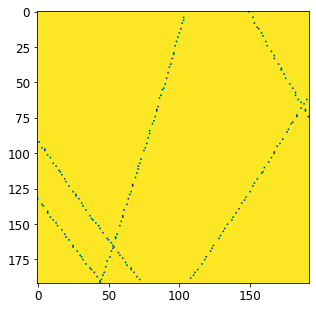

---------- frame 228--------------


KeyboardInterrupt: 

In [49]:
for f in range(len_video):
    print(f'---------- frame {f}--------------')

    plt.figure(figsize=(5,5))

    plt.imshow(masks[0][f][0].cpu())
    plt.show()

In [210]:
transformed_ssh_oi[frame].shape

(192, 192)

---------- frame 14--------------
NRMSE : 0.2954883949523954


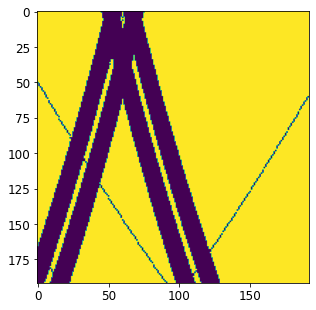

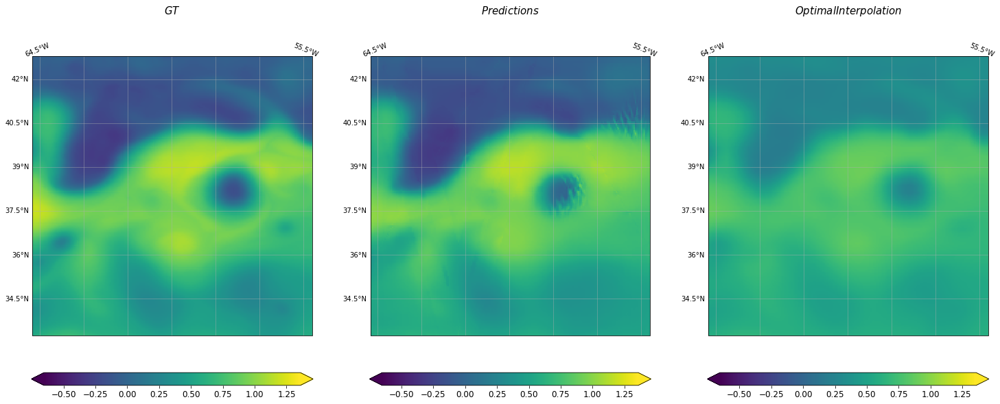

---------- frame 25--------------
NRMSE : 0.2998965160048002


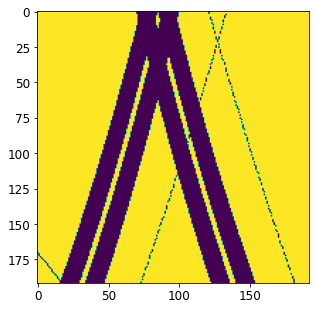

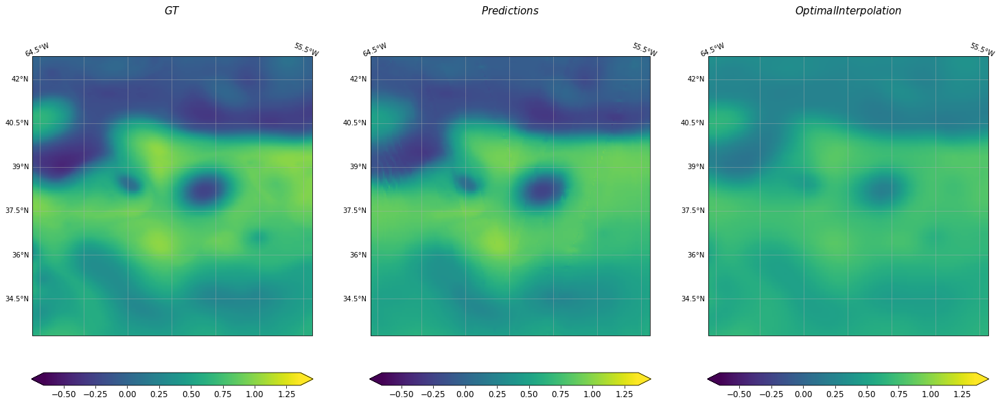

---------- frame 27--------------
NRMSE : 0.25250688471962673


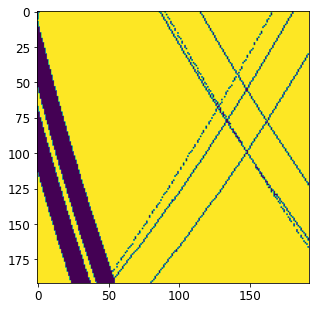

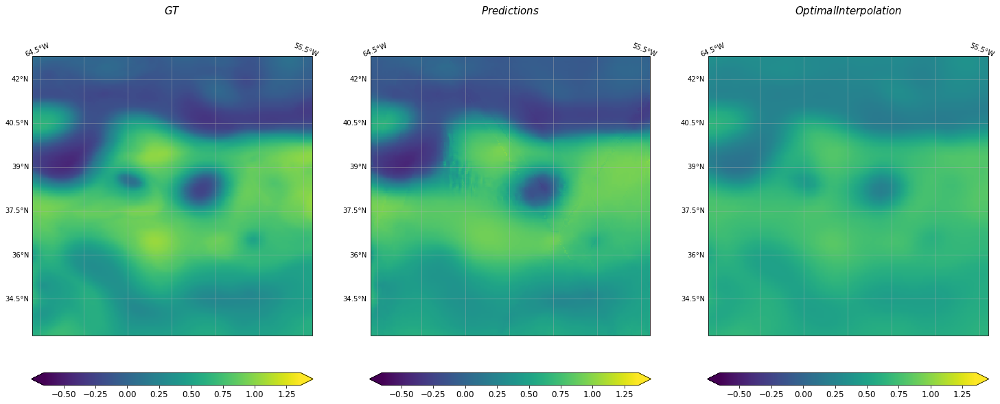

---------- frame 36--------------
NRMSE : 0.29651226162955185


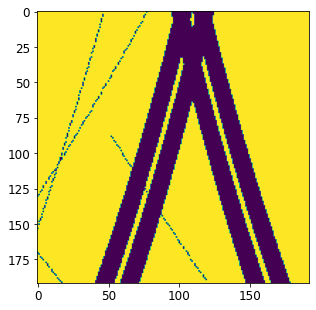

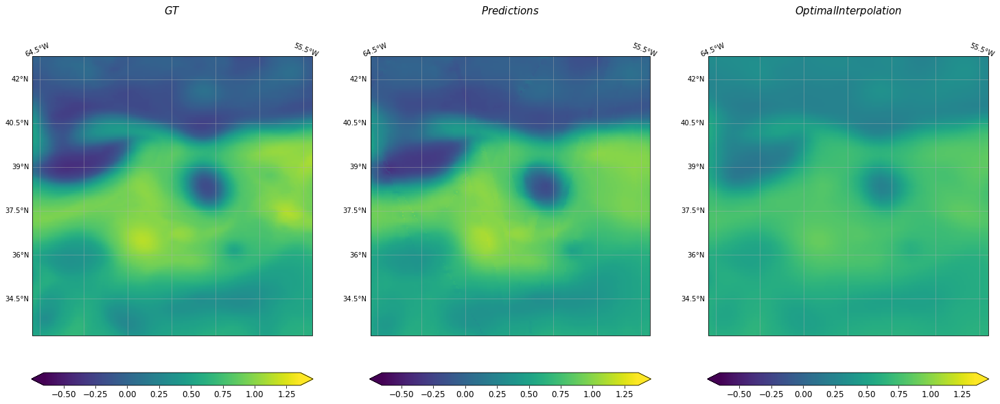

---------- frame 37--------------
NRMSE : 0.24860098428672528


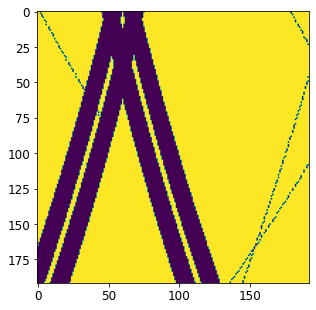

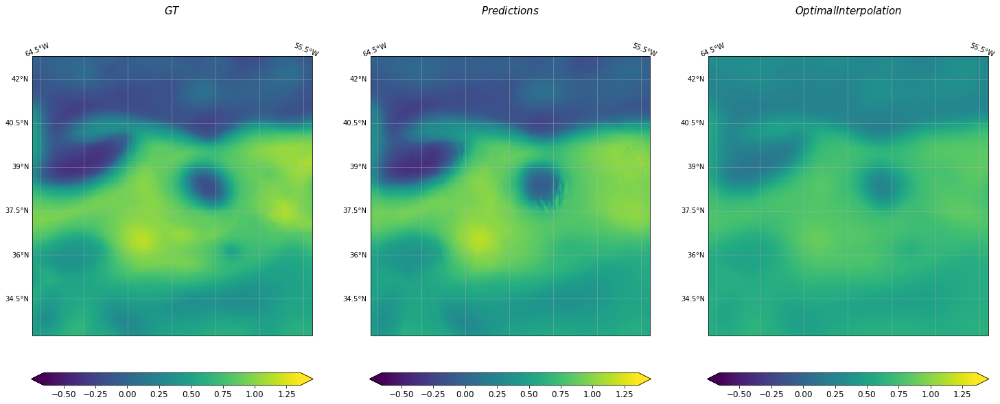

---------- frame 38--------------
NRMSE : 0.2583774588267699


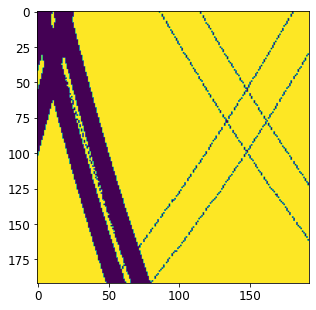

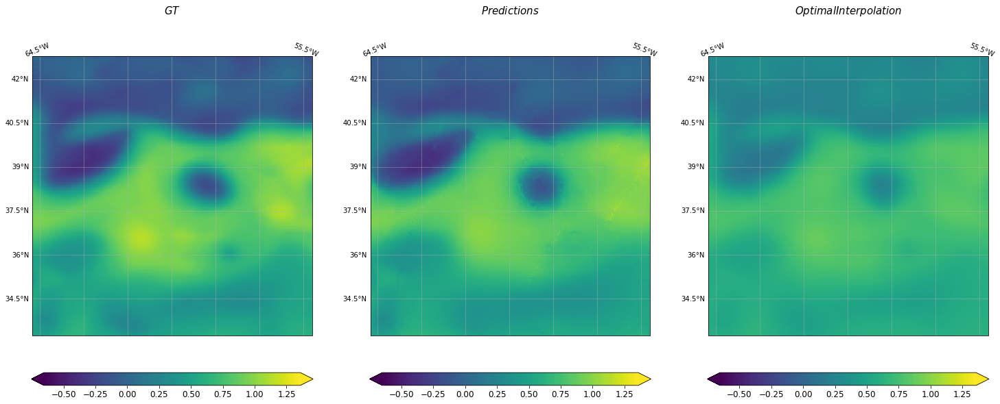

---------- frame 45--------------
NRMSE : 0.2876911784158531


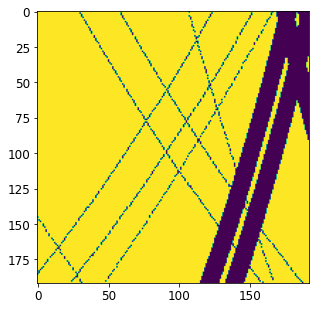

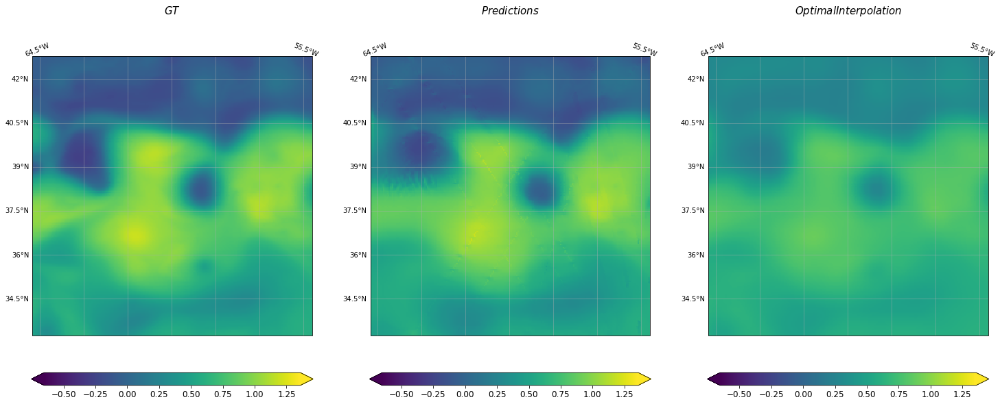

---------- frame 48--------------
NRMSE : 0.2711280082976429


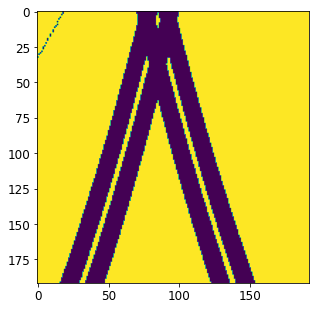

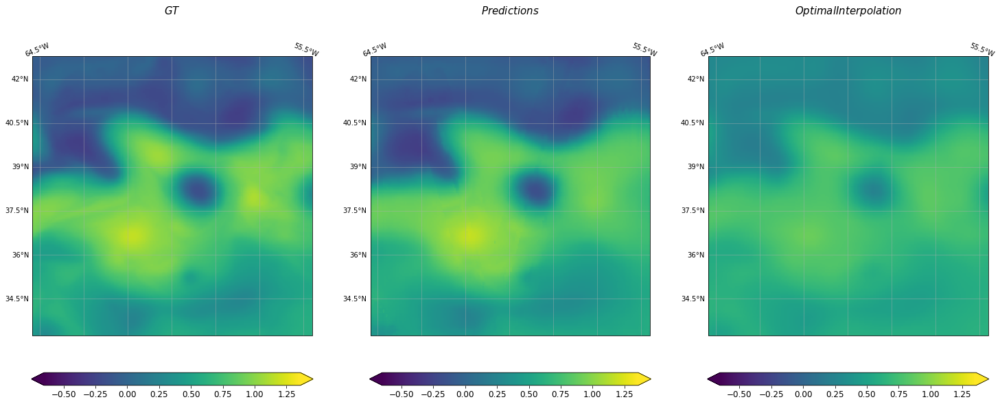

---------- frame 49--------------
NRMSE : 0.21015523674621442


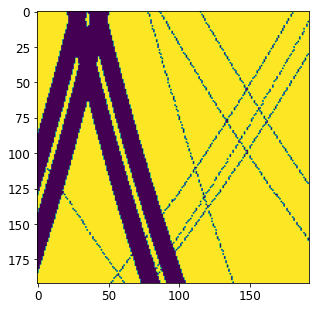

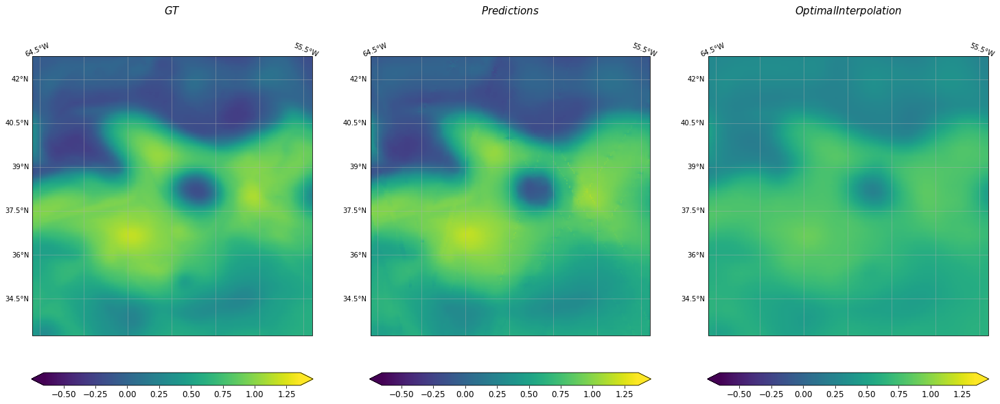

---------- frame 56--------------
NRMSE : 0.28906108359834637


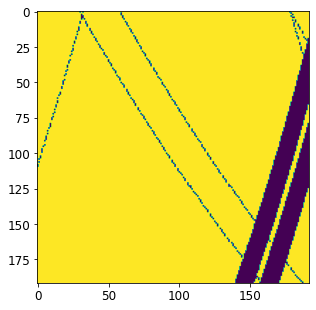

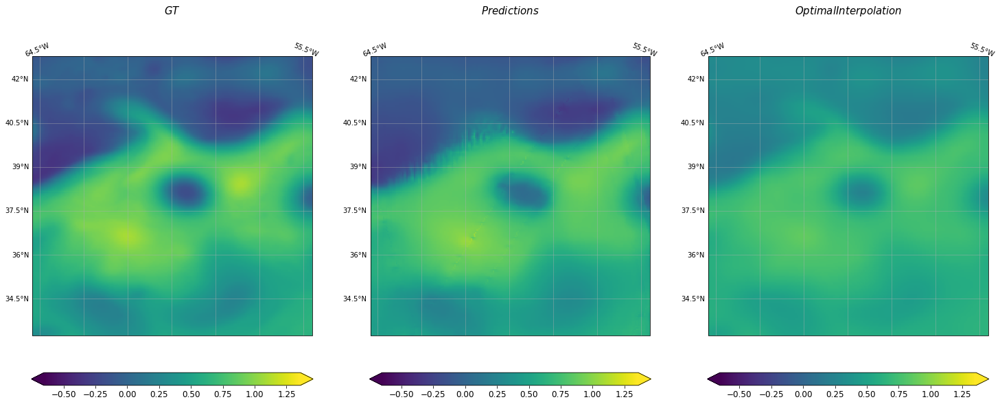

---------- frame 57--------------
NRMSE : 0.25608934561598784


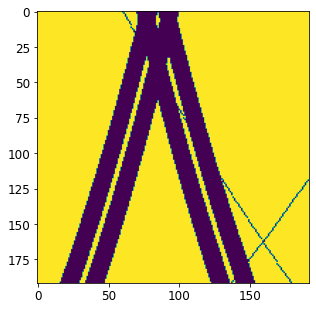

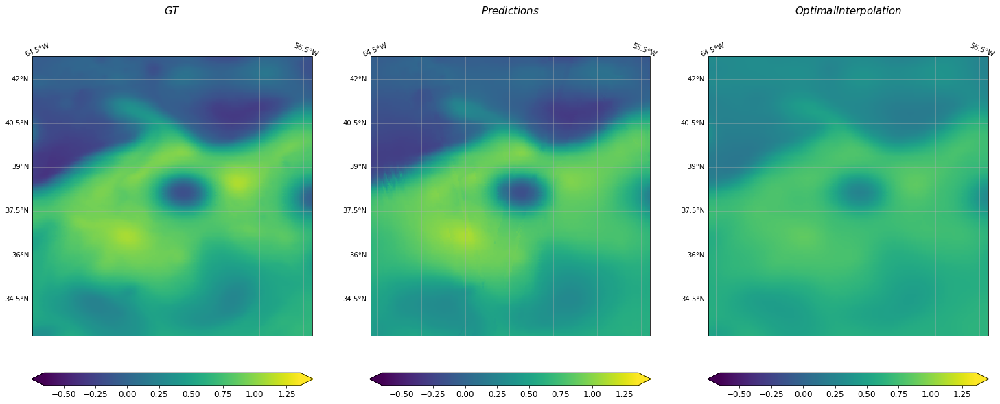

---------- frame 59--------------
NRMSE : 0.2887190889928889


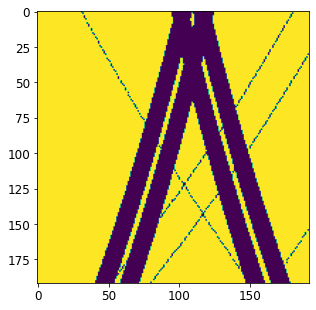

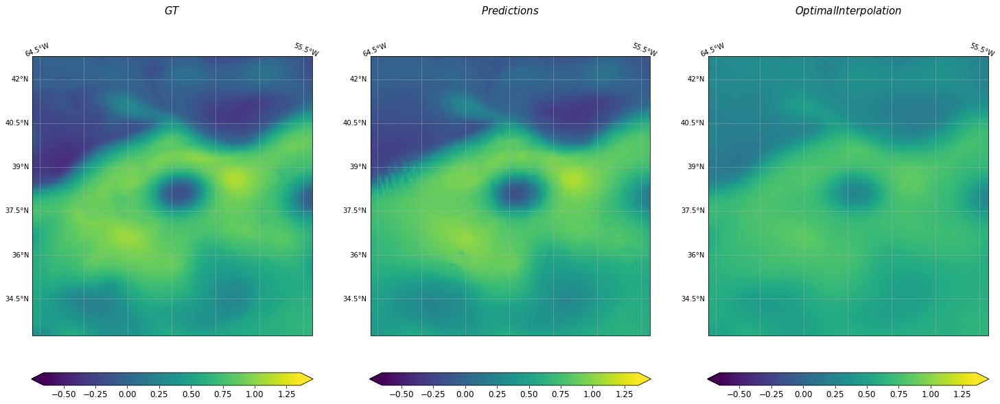

---------- frame 60--------------
NRMSE : 0.27422515274240766


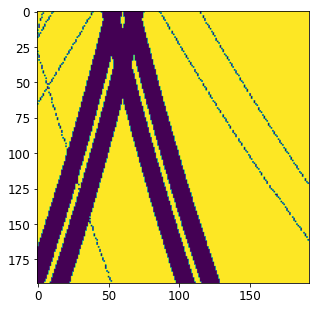

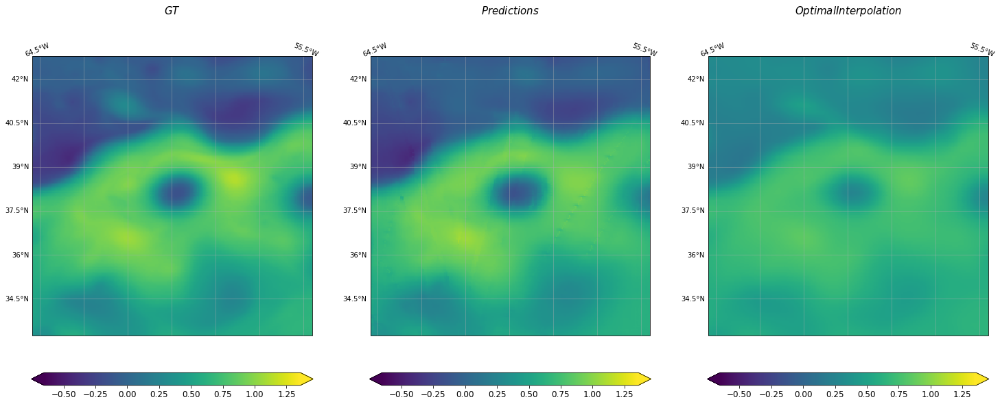

---------- frame 67--------------
NRMSE : 0.27077008498485466


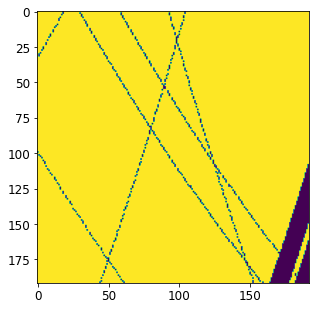

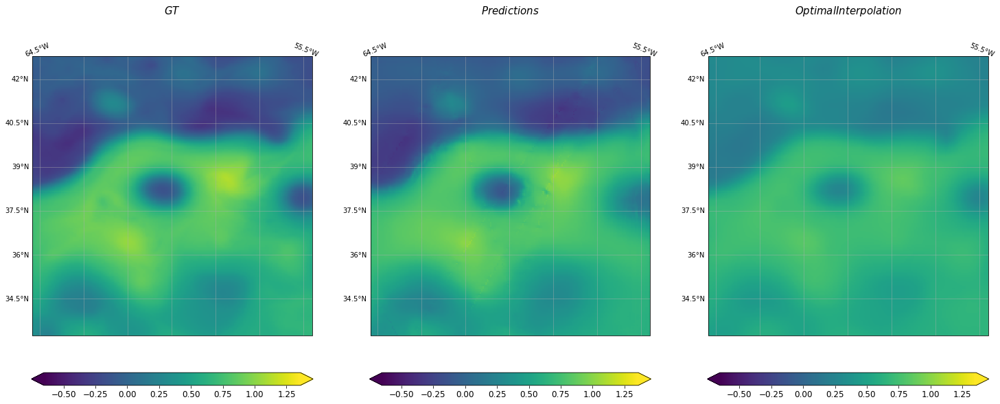

---------- frame 68--------------
NRMSE : 0.2510374603905625


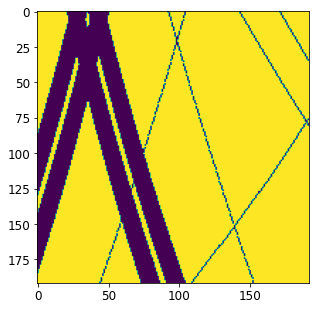

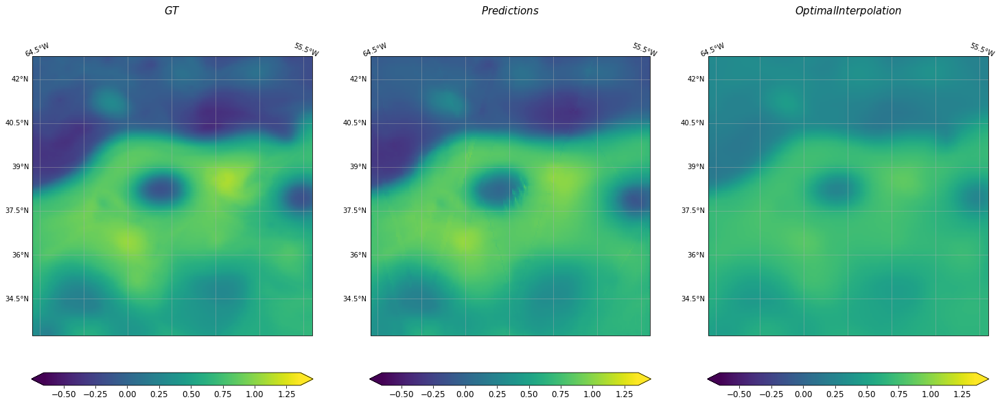

---------- frame 71--------------
NRMSE : 0.25193784090370414


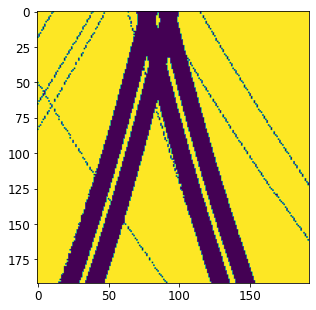

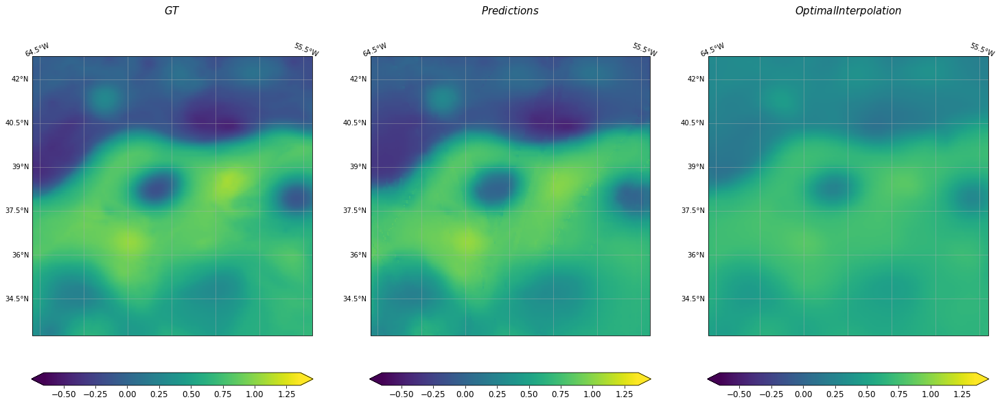

---------- frame 72--------------
NRMSE : 0.2425379771243528


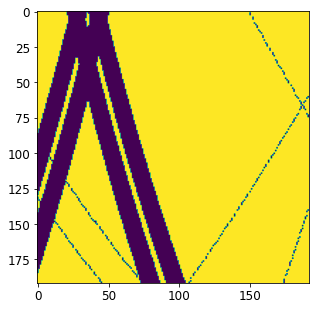

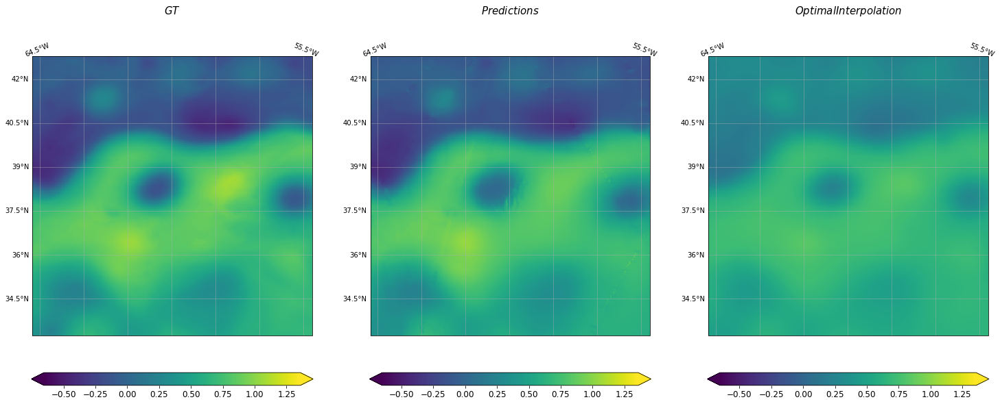

---------- frame 81--------------
NRMSE : 0.28064072190428


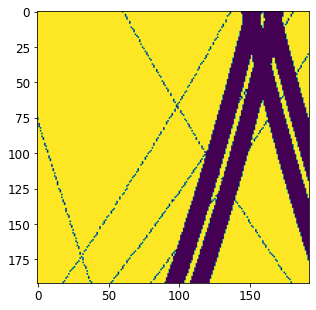

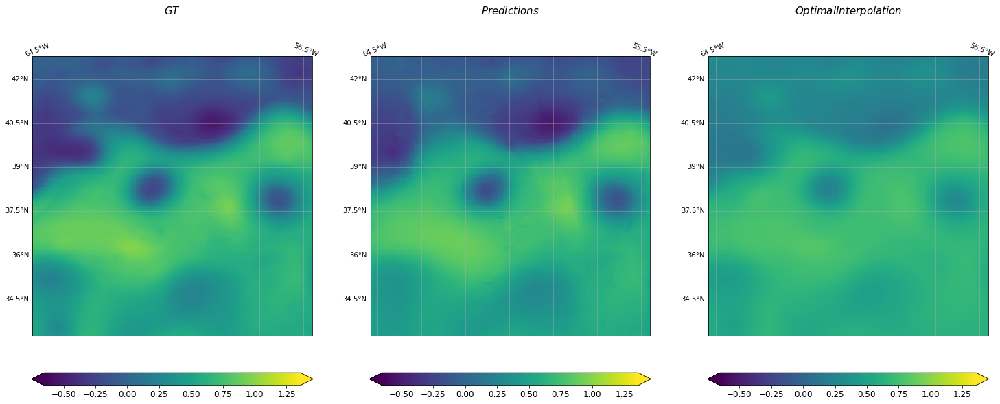

---------- frame 93--------------
NRMSE : 0.2970561602656841


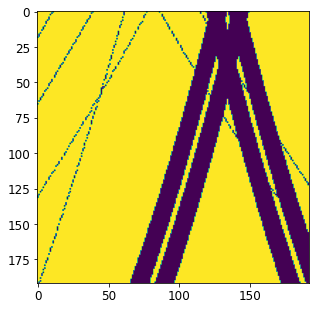

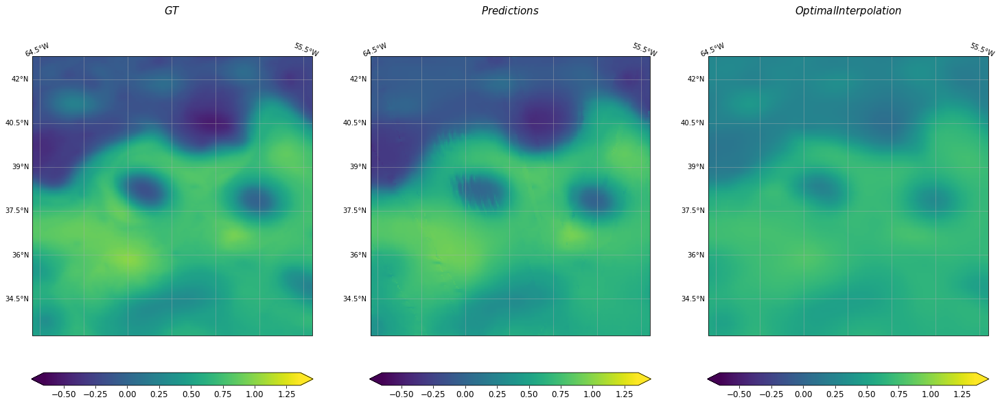

---------- frame 106--------------
NRMSE : 0.2516594211457467


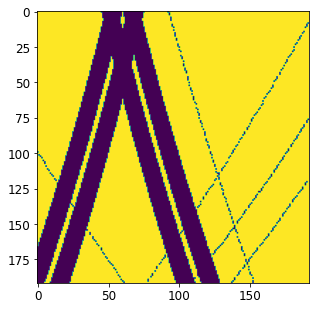

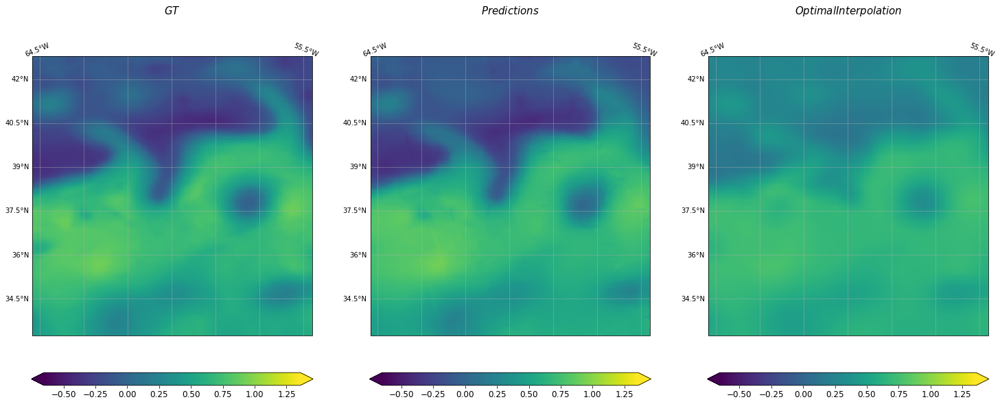

In [234]:
thresh = 0.3
for frame in np.where(nrmse<thresh)[0][:20]:
    print(f'---------- frame {frame}--------------')
    print(f'NRMSE : {nrmse[frame]}')
    plt.figure(figsize=(5,5))
    plt.imshow(masks[0][frame][0].cpu())

    fig, ax = plt.subplots(1,3,squeeze=False,
                            subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=0.0)))

    plot(ax,0,0,lon,lat,gt[frame], r"$GT$",\
                 extent=extent,cmap='viridis',vmin=minn,vmax=maxx)

    plot(ax,0,1,lon,lat,prediction_ssh[frame], r"$Predictions$",\
                 extent=extent,cmap='viridis',vmin=minn,vmax=maxx)
    
    plot(ax,0,2,lon,lat,transformed_ssh_oi[frame], r"$Optimal Interpolation$",\
                 extent=extent,cmap='viridis',vmin=minn,vmax=maxx)
    plt.show()

---------- frame 20--------------
Performance : 0.39483293164074584


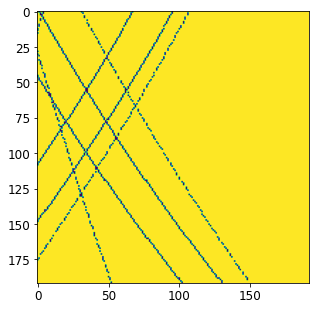

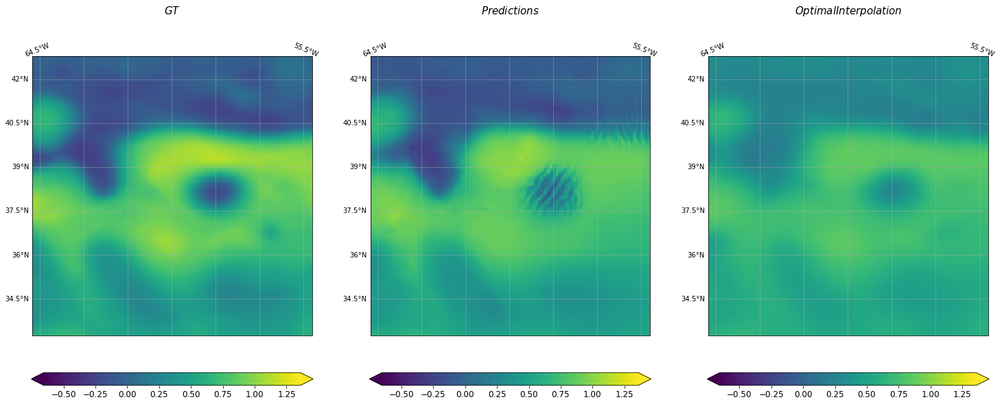

---------- frame 19--------------
Performance : 0.5191496386428526


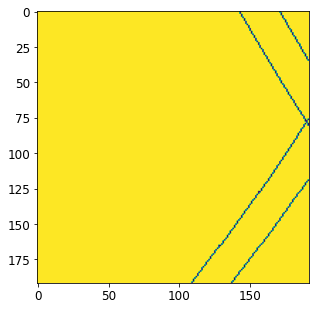

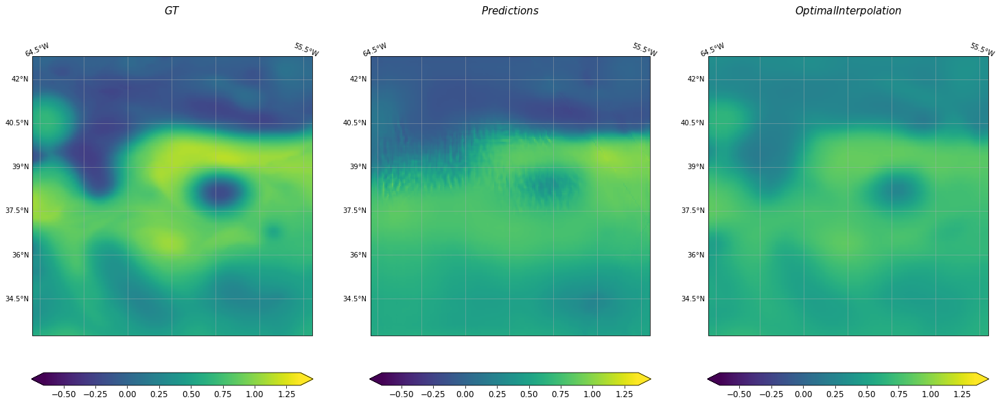

---------- frame 18--------------
Performance : 0.5865706631686743


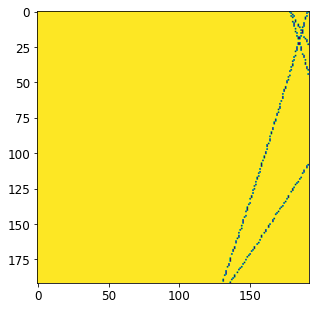

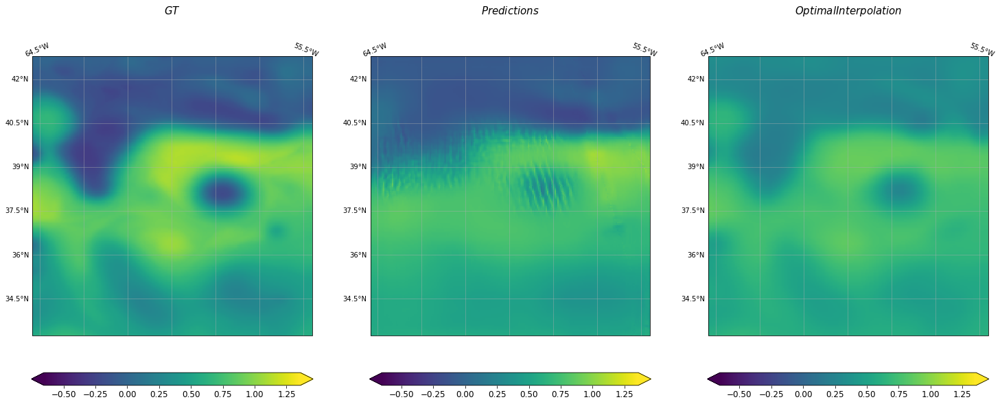

---------- frame 17--------------
Performance : 0.46195314755594763


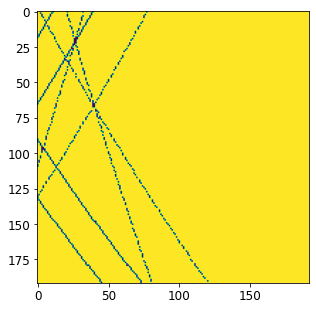

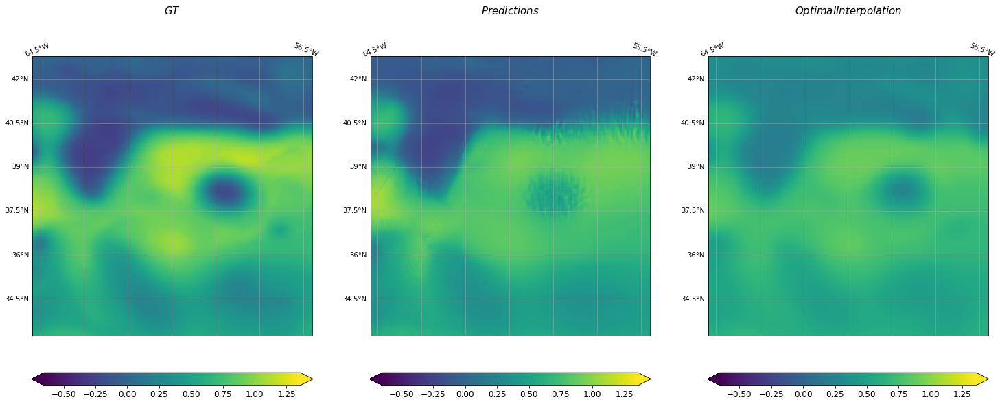

---------- frame 16--------------
Performance : 0.4114271781688318


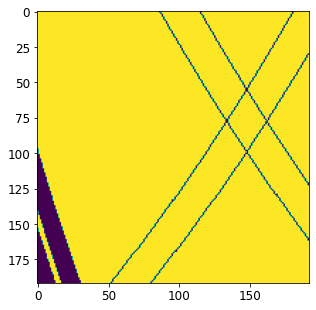

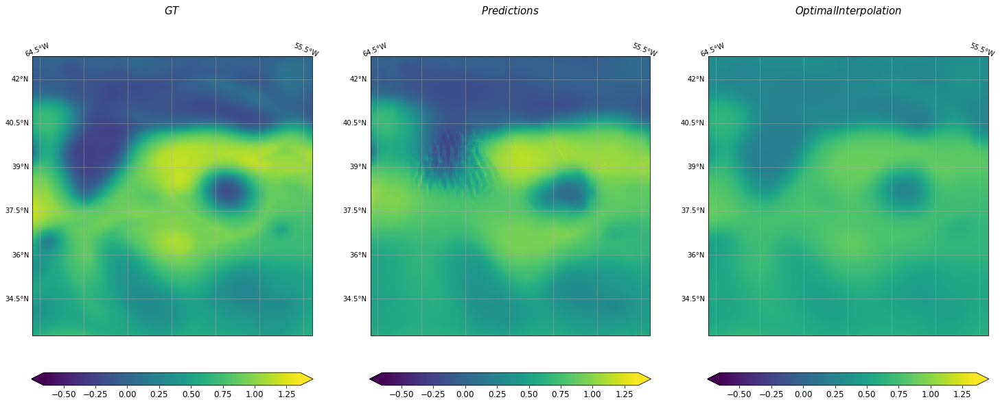

---------- frame 15--------------
Performance : 0.48118212203919514


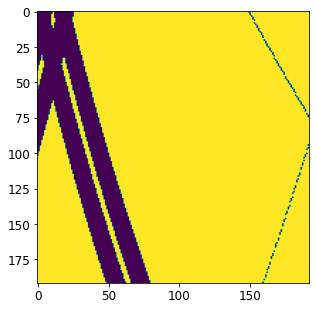

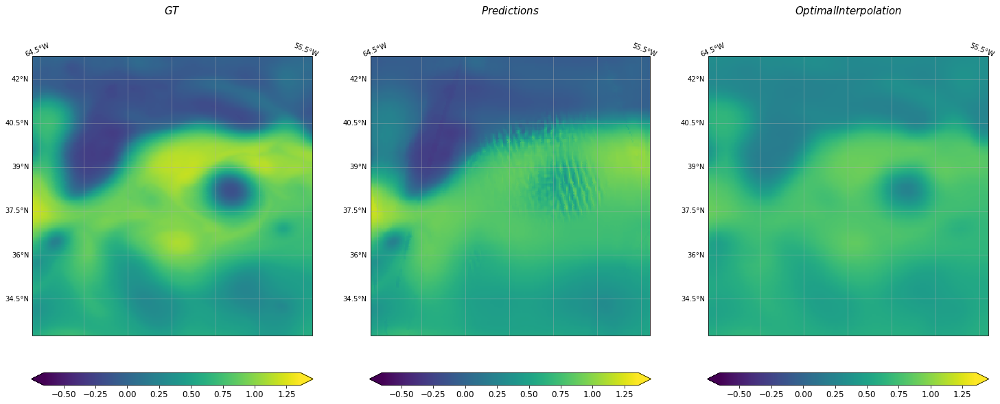

---------- frame 13--------------
Performance : 0.48383223902053774


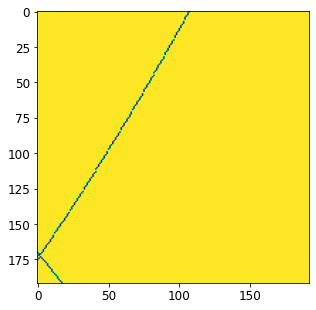

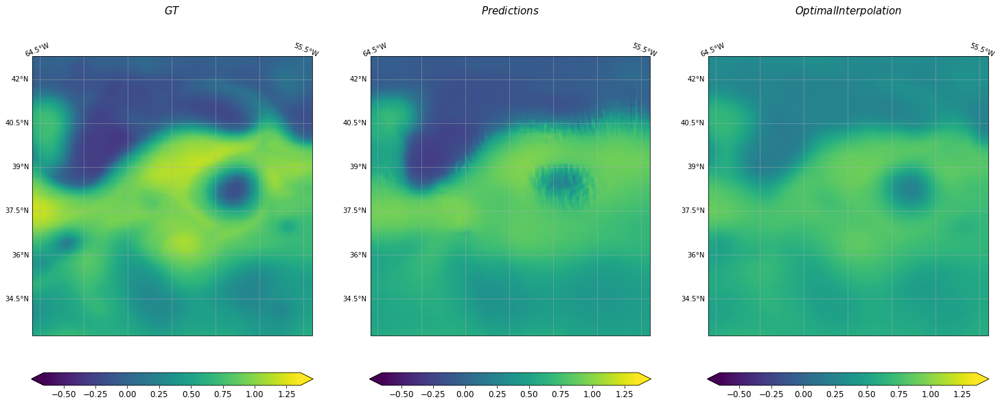

---------- frame 12--------------
Performance : 0.3200913888253765


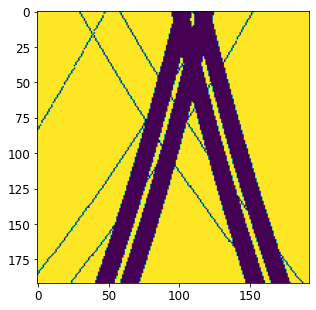

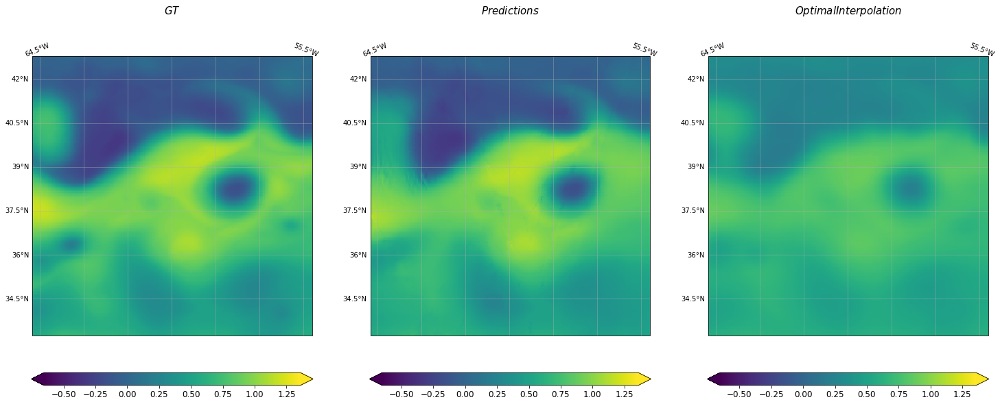

---------- frame 11--------------
Performance : 0.42389548214701966


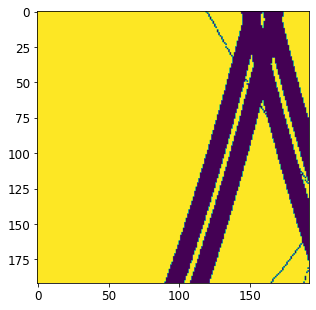

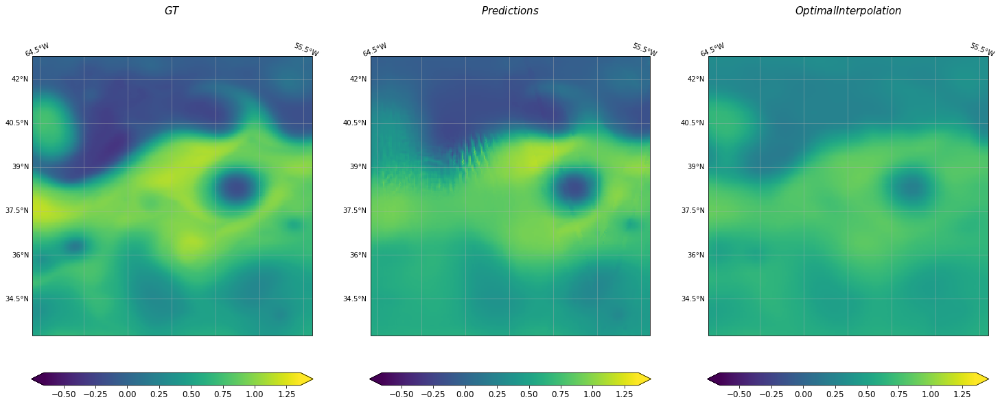

---------- frame 10--------------
Performance : 0.31656637773465957


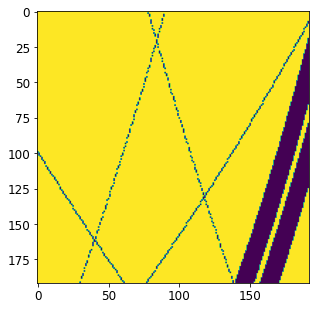

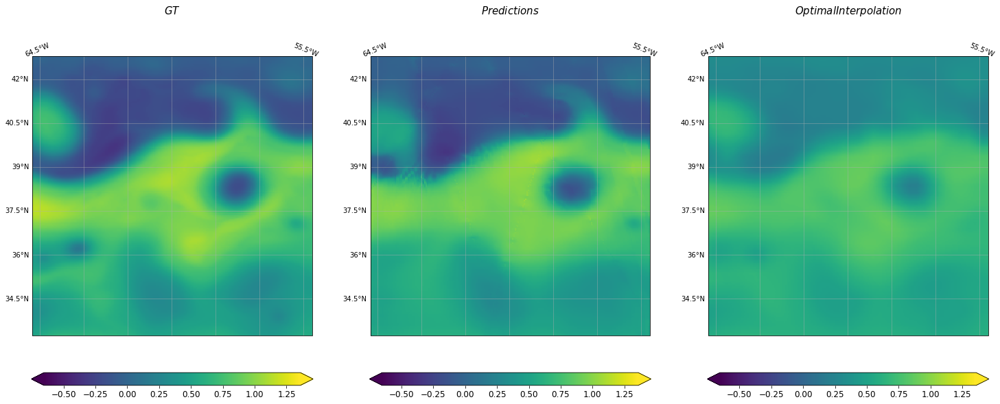

---------- frame 9--------------
Performance : 0.4427568703312966


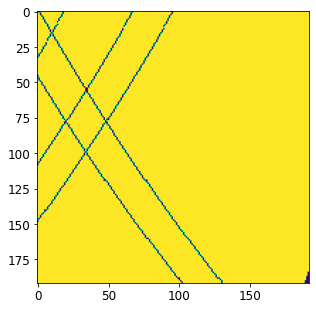

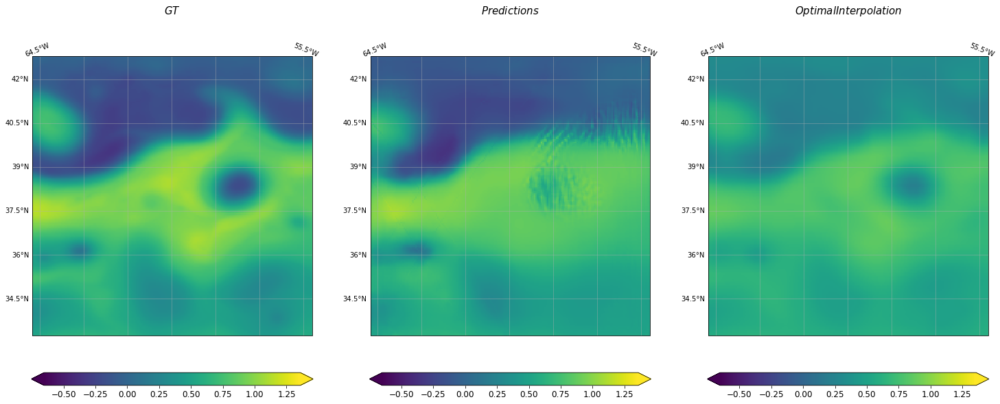

---------- frame 8--------------
Performance : 0.4649451673566895


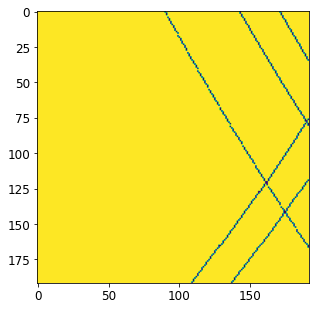

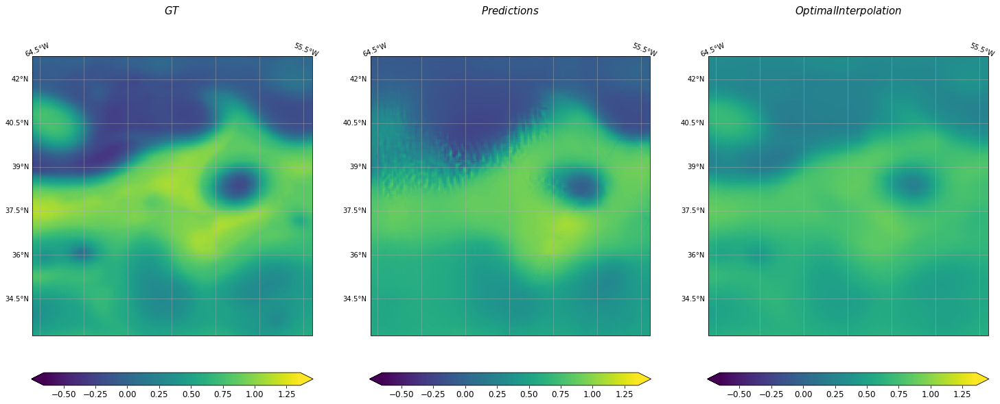

---------- frame 7--------------
Performance : 0.4182430639425377


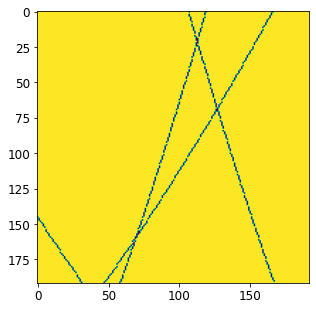

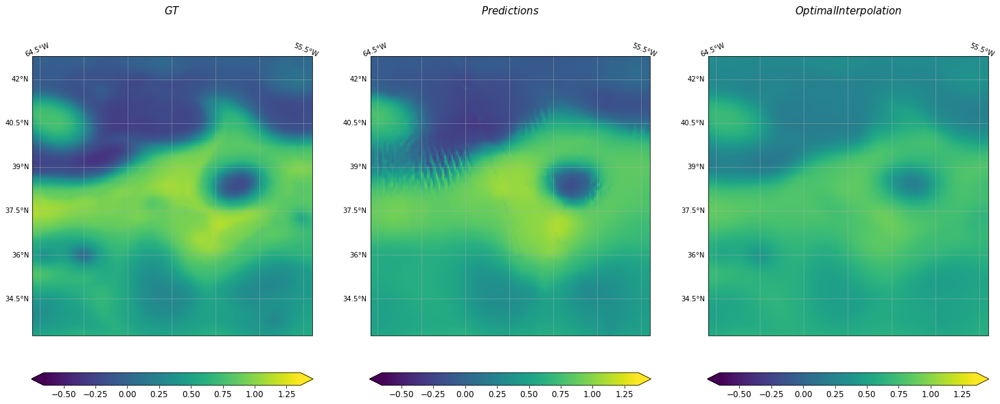

---------- frame 6--------------
Performance : 0.4481612392824296


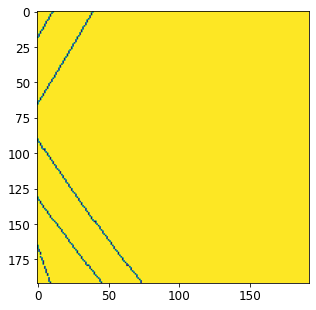

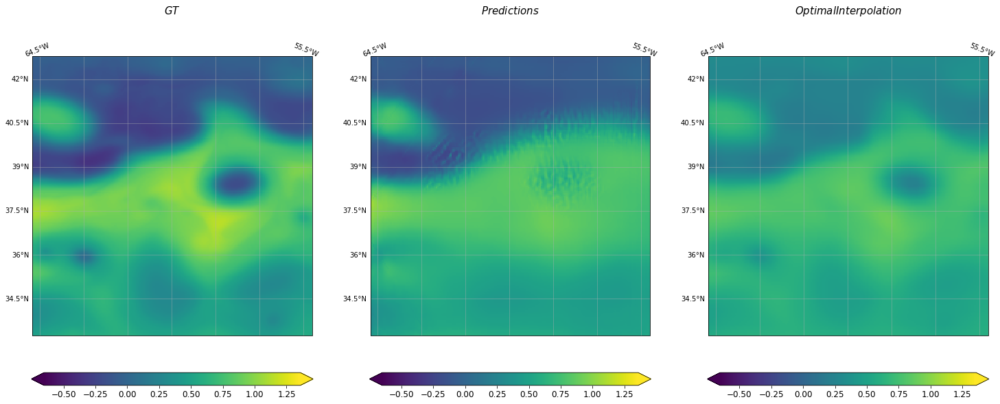

---------- frame 5--------------
Performance : 0.45086037854324634


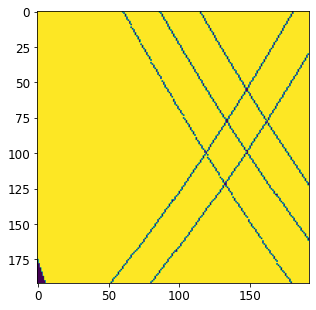

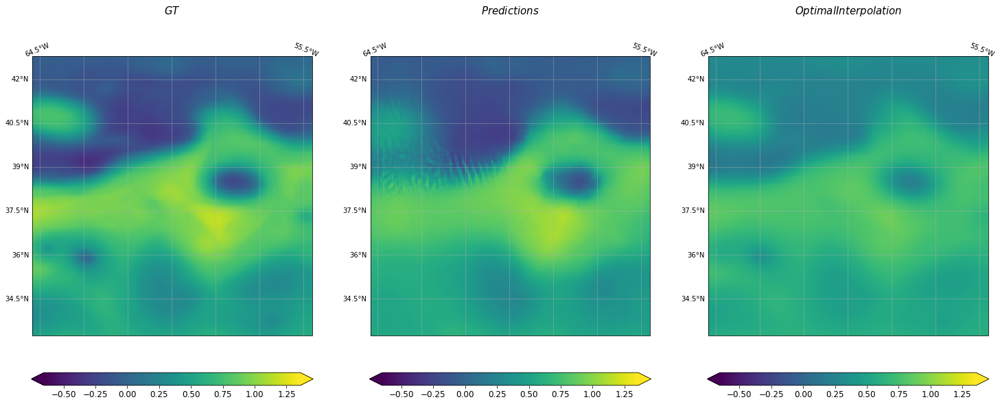

---------- frame 4--------------
Performance : 0.40261457069252


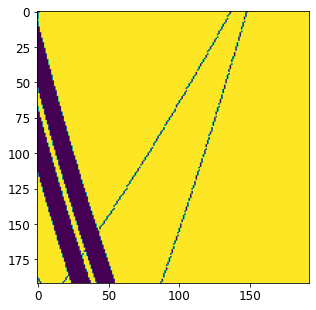

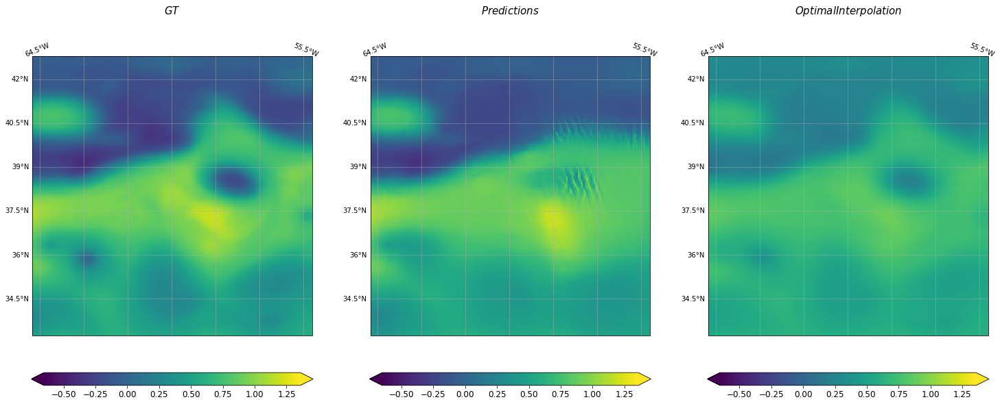

---------- frame 3--------------
Performance : 0.40537608901416344


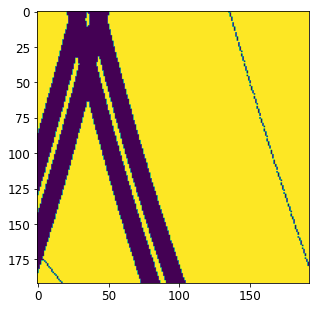

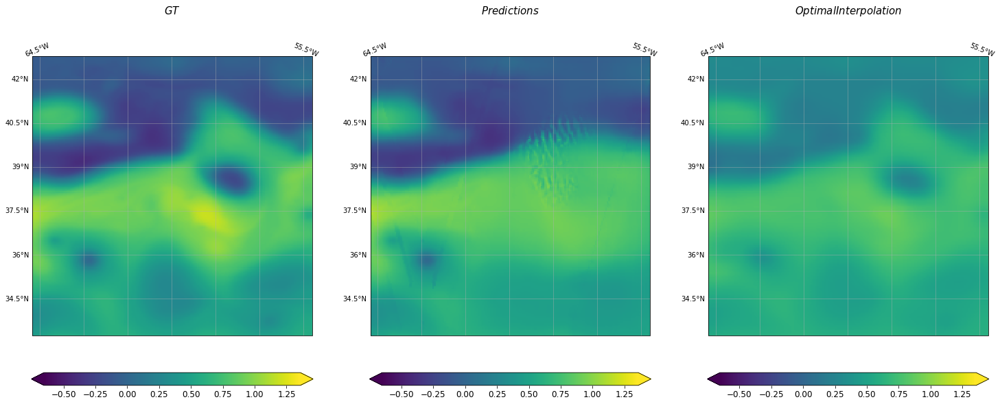

---------- frame 2--------------
Performance : 0.31824941474343227


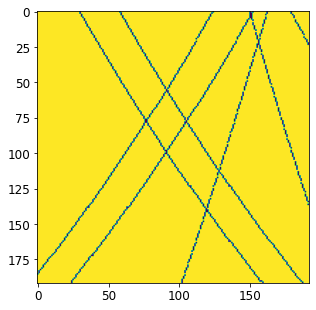

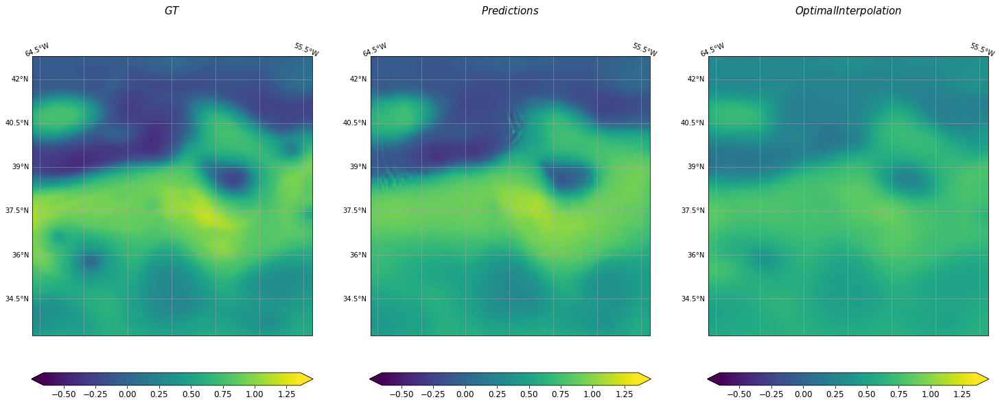

---------- frame 1--------------
Performance : 0.5568335306788769


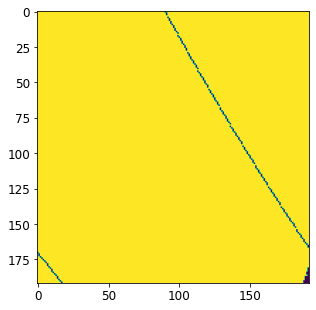

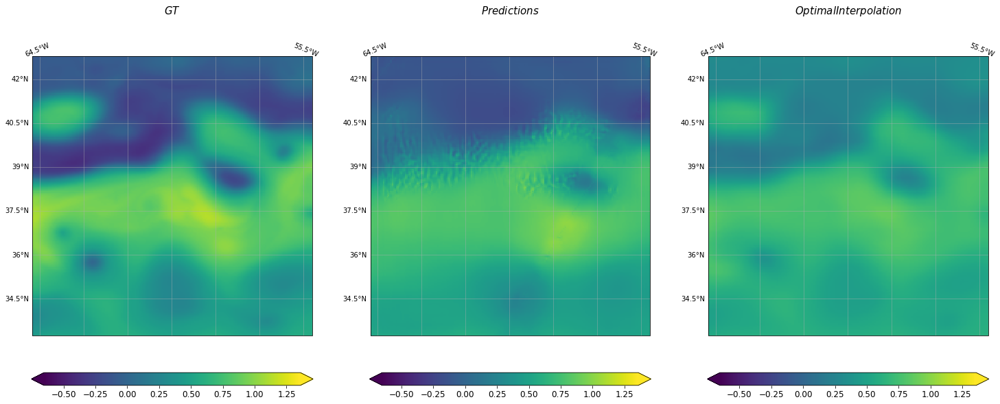

---------- frame 0--------------
Performance : 0.32262602447607036


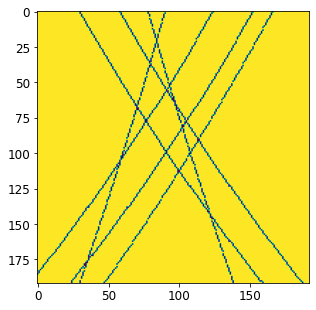

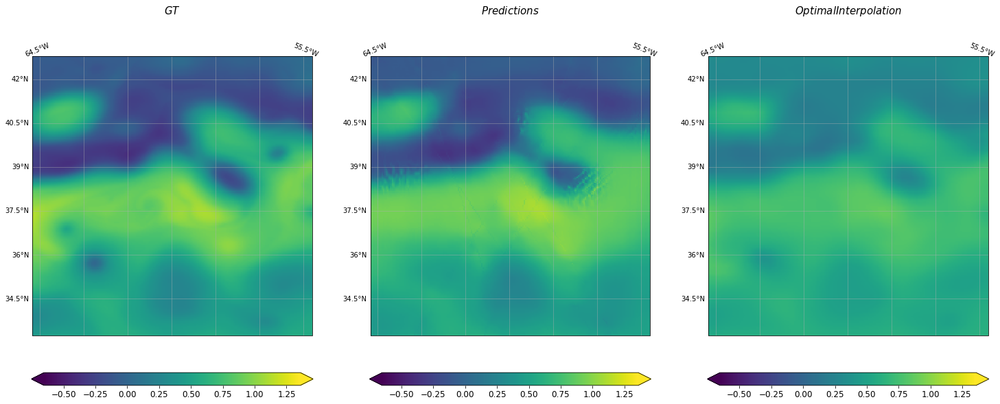

In [237]:
for frame in np.where(nrmse>thresh)[0][:20][::-1]:
    print(f'---------- frame {frame}--------------')
    print(f'Performance : {nrmse[frame]}')

    plt.figure(figsize=(5,5))
    plt.imshow(masks[0][frame][0].cpu())

    fig, ax = plt.subplots(1,3,squeeze=False,
                            subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=0.0)))

    plot(ax,0,0,lon,lat,gt[frame], r"$GT$",\
                 extent=extent,cmap='viridis',vmin=minn,vmax=maxx)

    plot(ax,0,1,lon,lat,prediction_ssh[frame], r"$Predictions$",\
                 extent=extent,cmap='viridis',vmin=minn,vmax=maxx)
    
    plot(ax,0,2,lon,lat,transformed_ssh_oi[frame], r"$Optimal Interpolation$",\
                 extent=extent,cmap='viridis',vmin=minn,vmax=maxx)
    plt.show()